# Notebook (propre) sur les données textuelles lié au plongement de mot dans des espaces vectorielles dense et non éparse comme les BOW.

<font color='red'> Il a été utilisé sur google colab. à la différence du Notebook 3 et 1 (car opencv était accessible depuis mon pc plus facilement) Le notebook 4, qui utilise tensorflow et notamment les GPU à été égalmenet fait sur google colab

Une étude exploratoire a été effectuée sur le notebook brouillon

In [ ]:
from google.colab import drive
drive.mount('/content/drive') 
#seulement si on travaille sur google drive
import os
os.chdir("/content/drive/MyDrive/formationOCR/P6")

Mounted at /content/drive


In [ ]:
import gensim
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
import pandas as pd
import nltk
nltk.download('omw-1.4')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
from nltk.corpus import stopwords

from nltk.tokenize import sent_tokenize, word_tokenize
import numpy as np

[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Unzipping corpora/omw-1.4.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


In [ ]:
!pip install tensorflow_text
!pip install tensorflow_hub
!pip install transformers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 4.6 MB 16.2 MB/s 
     |█████▋                          | 89.6 MB 1.4 MB/s eta 0:04:53ERROR: Exception:
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/pip/_internal/cli/base_command.py", line 180, in _main
    status = self.run(options, args)
  File "/usr/local/lib/python3.7/dist-packages/pip/_internal/cli/req_command.py", line 199, in wrapper
    return func(self, options, args)
  File "/usr/local/lib/python3.7/dist-packages/pip/_internal/commands/install.py", line 319, in run
    reqs, check_supported_wheels=not options.target_dir
  File "/usr/local/lib/python3.7/dist-packages/pip/_internal/resolution/resolvelib/resolver.py", line 128, in resolve
    requirements, max_rounds=try_to_avoid_resolution_too_deep
  File "/usr/local/lib/python3.7/dist-packages/pip/_vendor/resolvelib/resolvers.py", line 473, in resolve
 

In [ ]:
import transformers
import tensorflow_hub as hub
import tensorflow_text as text
import tensorflow as tf
print('tf version',tf.__version__)

print('hub version',hub.__version__)
print('text version',text.__version__)
print('transformers version',transformers.__version__)

tf version 2.9.1
hub version 0.12.0
text version 2.9.0
transformers version 4.19.4


In [ ]:
data = pd.read_csv(
    r"" + os.getcwd() + "/Flipkart/flipkart_com-ecommerce_sample_1050.csv"
)

In [ ]:
data.product_category_tree=data.product_category_tree.apply(lambda x:x.split('>>')[0][2:-1])
data.rename({'product_category_tree':'cat'},axis=1,inplace=True)

### Petit intérêt par rapport au prix et voir la corrélation s'il en existe une

In [ ]:
gp_cat=data.groupby('cat').retail_price.describe()

(array([0, 1, 2, 3, 4, 5, 6]), <a list of 7 Text major ticklabel objects>)

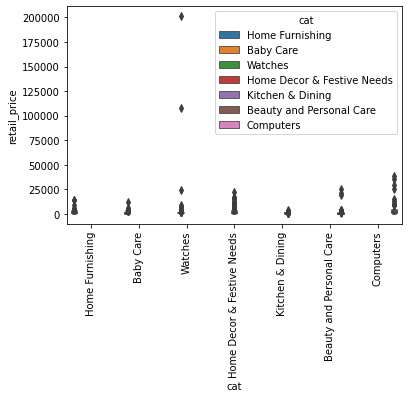

In [ ]:
sns.boxplot(x='cat',y='retail_price',data=data,hue='cat')
plt.xticks(rotation=90)

(array([0, 1, 2, 3, 4, 5, 6]), <a list of 7 Text major ticklabel objects>)

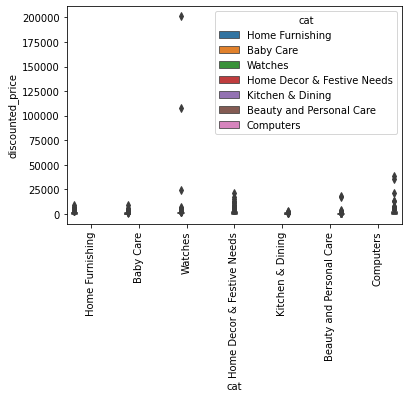

In [ ]:
sns.boxplot(x='cat',y='discounted_price',data=data,hue='cat')
plt.xticks(rotation=90)

In [ ]:
data.discounted_price

0        899.0
1        449.0
2          NaN
3       1299.0
4        698.0
         ...  
1045     999.0
1046    1896.0
1047    1449.0
1048    1333.0
1049     595.0
Name: discounted_price, Length: 1050, dtype: float64

### load des données intéressantes

In [ ]:
df=data[['description','cat']]
del data

In [ ]:

# Tokenizer

from nltk.corpus import stopwords

from nltk.tokenize import sent_tokenize, word_tokenize

def tokenizer_fct(sentence) :
    # print(sentence)
    sentence_clean = sentence.replace('-', ' ').replace('+',
                                                        ' ').replace('/', ' ').replace('#', ' ')
    word_tokens = word_tokenize(sentence_clean)
    return word_tokens

# Stop words
stop_w = list(set(stopwords.words('english'))) + ['[', ']', 
                                                  ',', '.', ':', '?', '(', ')']

def stop_word_filter_fct(list_words) :
    filtered_w = [w for w in list_words if not w in stop_w]
    filtered_w2 = [w for w in filtered_w if len(w) > 2]
    return filtered_w2

# lower case et alpha
def lower_start_fct(list_words) :
    lw = [w.lower() for w in list_words if (not w.startswith("@")) 
    #                                   and (not w.startswith("#"))
                                       and (not w.startswith("http"))]
    return lw

# Lemmatizer (base d'un mot)
from nltk.stem import WordNetLemmatizer

def lemma_fct(list_words) :
    lemmatizer = WordNetLemmatizer()
    lem_w = [lemmatizer.lemmatize(w) for w in list_words]
    return lem_w

# Fonction de préparation du texte pour le bag of words (Countvectorizer et Tf_idf, Word2Vec)
def transform_bow_fct(desc_text) :
    word_tokens = tokenizer_fct(desc_text)
    sw = stop_word_filter_fct(word_tokens)
    lw = lower_start_fct(sw)
    transf_desc_text = ' '.join(lw)
    return transf_desc_text

def transform_bow_lem_fct(desc_text) :
    word_tokens = tokenizer_fct(desc_text)
    sw = stop_word_filter_fct(word_tokens)
    lw = lower_start_fct(sw)
    lem_w = lemma_fct(lw)    
    transf_desc_text = ' '.join(lem_w)
    return transf_desc_text

def transform_dl_fct(desc_text) :
    word_tokens = tokenizer_fct(desc_text)
    lw = lower_start_fct(word_tokens)
    transf_desc_text = ' '.join(lw)
    return transf_desc_text
df_=df[['description','cat']].copy()
df_['sentence_bow'] = df['description'].apply(lambda x : transform_bow_fct(x))
df_['sentence_bow_lem'] = df['description'].apply(lambda x : transform_bow_lem_fct(x))
df_['sentence_dl'] = df['description'].apply(lambda x : transform_dl_fct(x))
df_.shape


(1050, 5)

## Word2vec
On va voir dans cette partie l'approche simple qui consiste à donner le contexte d'un mot pour lui donner un sens. Il existe deux possibilité: deviner un mot par rapport à son contexte ou deviner le contexte d'un mot.

 on va voir l'approche plutôt simple consistant 

In [ ]:
import gensim.downloader as api
word_vectors = api.load("word2vec-google-news-300")  

[==================================================] 100.0% 1662.8/1662.8MB downloaded


In [ ]:
word_vectors.vectors.shape

(3000000, 300)

In [ ]:

def my_doc_2_vec(doc,trained):
    p = trained.vectors.shape[1]
    vec = np.zeros(p)
    #nombre de tokens trouvés
    nb = 0
    #traitement de chaque token du document
    for tk in doc:
        #ne traiter que les tokens reconnus
        try:
            values = trained[tk]
            vec = vec + values
            nb = nb + 1.0
        except:
            pass
    #faire la moyenne des valeurs
    #uniquement si on a trové des tokens reconnus bien sûr
    if (nb > 0.0):
        vec = vec/nb
    #renvoyer le vecteur
    #si aucun token trouvé, on a un vecteur de valeurs nulles
    return vec

In [ ]:
corpus_=[sent.split() for sent in df_['sentence_dl'].to_list()]

In [ ]:
#traiter les documents du corpus corpus
docsVec = list()
#pour chaque document du corpus nettoyé
for doc in corpus_:
    #calcul de son vecteur
    vec = my_doc_2_vec(doc,word_vectors)
    #ajouter dans la liste
    docsVec.append(vec)
#transformer en matrice numpy
matVec = np.array(docsVec)
print(matVec.shape)

(1050, 300)


In [ ]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

shape vect bert (1050, 300)
shape pca bert (1050, 224)


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


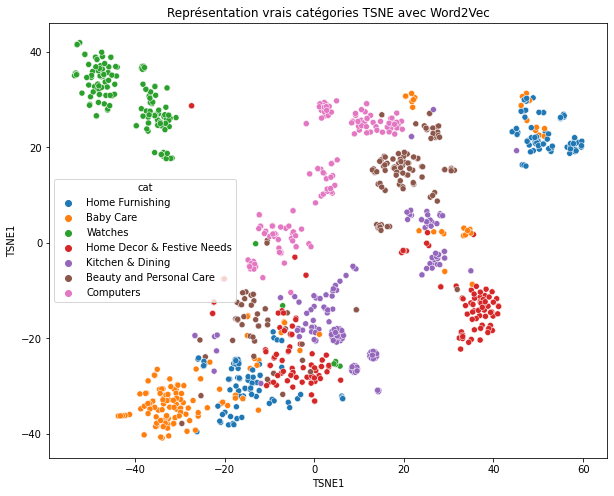

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


ARI : 0.4158808409866995


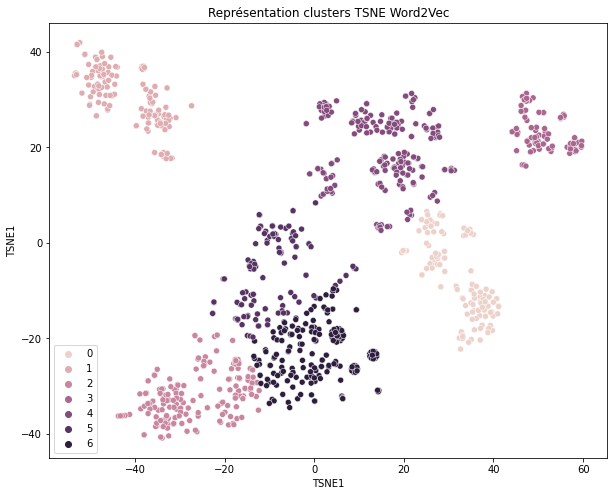

__________________


In [ ]:
  print('shape vect bert',matVec.shape)
  scaler=StandardScaler()
  x_scal=scaler.fit_transform(matVec)
  pca=PCA(n_components=0.99)
  x_pca=pca.fit_transform(x_scal)
  print('shape pca bert',x_pca.shape)

  tsne=TSNE(n_components=2, perplexity=30, n_iter=2000, 
                                  init='random', learning_rate=200, random_state=42)
  x_tsne=tsne.fit_transform(x_pca)
  fig,ax=plt.subplots(figsize=(10,8))
  sns.scatterplot(x_tsne[:,0],x_tsne[:,1],hue=df.cat,ax=ax)
  ax.set_xlabel('TSNE1')
  ax.set_ylabel('TSNE1')
  plt.title('Représentation vrais catégories TSNE avec Word2Vec')
  plt.show()
  model1=KMeans(n_clusters=7,random_state=6)
  model1.fit(x_tsne)
  fig,ax=plt.subplots(figsize=(10,8))
  sns.scatterplot(x_tsne[:,0],x_tsne[:,1],hue=model1.labels_,ax=ax)
  ax.set_xlabel('TSNE1')
  ax.set_ylabel('TSNE1')
  plt.title('Représentation clusters TSNE Word2Vec')
  print('ARI :', adjusted_rand_score(df.cat,model1.labels_))
  plt.show()
  print('__________________')

_______description_______
shape vect bert (1050, 300)
shape pca bert (1050, 230)


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


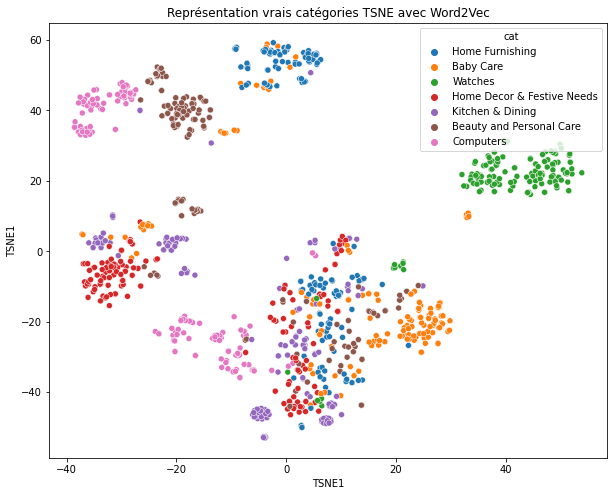

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


ARI : 0.32344575176212037


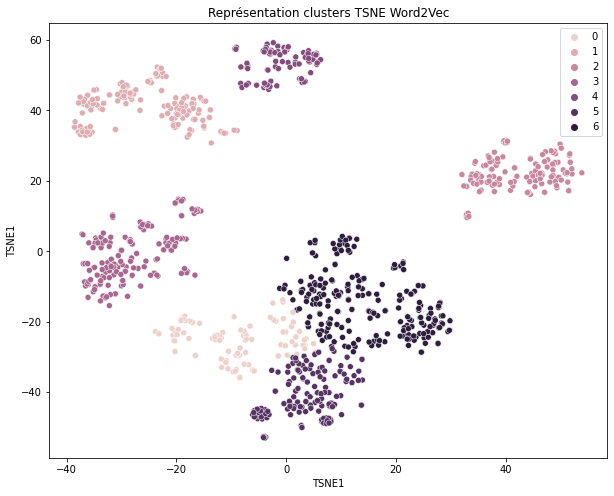

__________________
_______sentence_bow_______
shape vect bert (1050, 300)
shape pca bert (1050, 223)


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


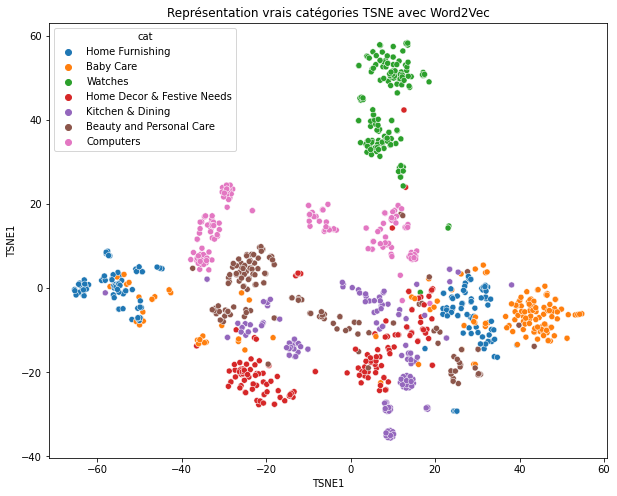

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


ARI : 0.3967547920392821


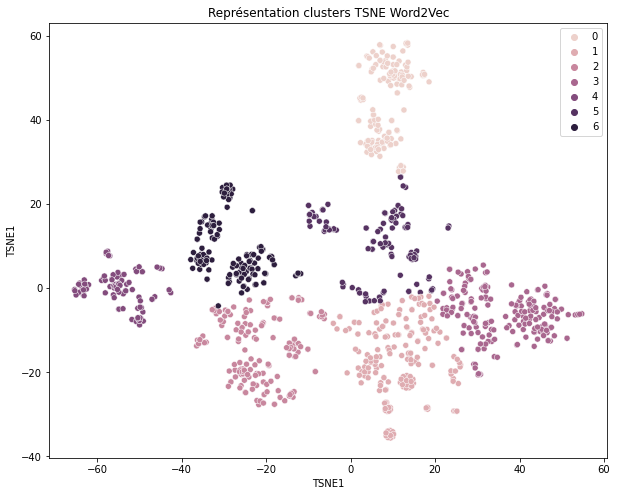

__________________
_______sentence_bow_lem_______
shape vect bert (1050, 300)
shape pca bert (1050, 222)


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


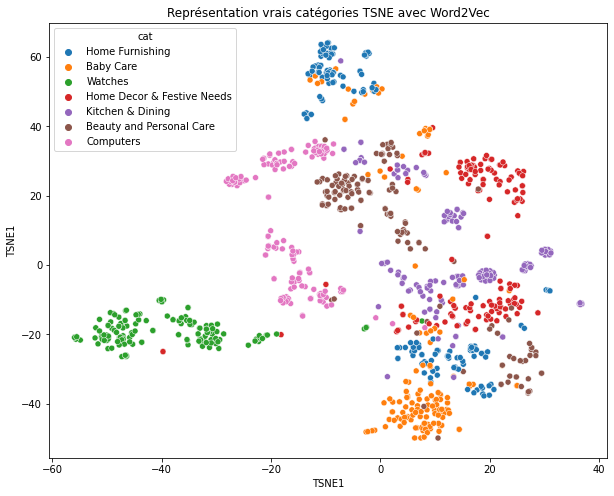

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


ARI : 0.401873619533341


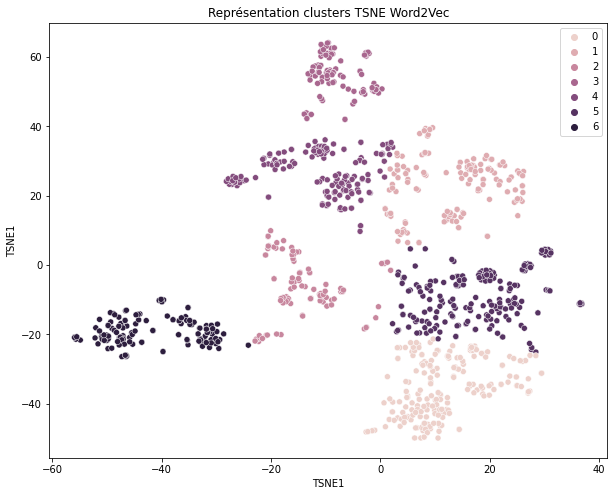

__________________
_______sentence_dl_______
shape vect bert (1050, 300)
shape pca bert (1050, 224)


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


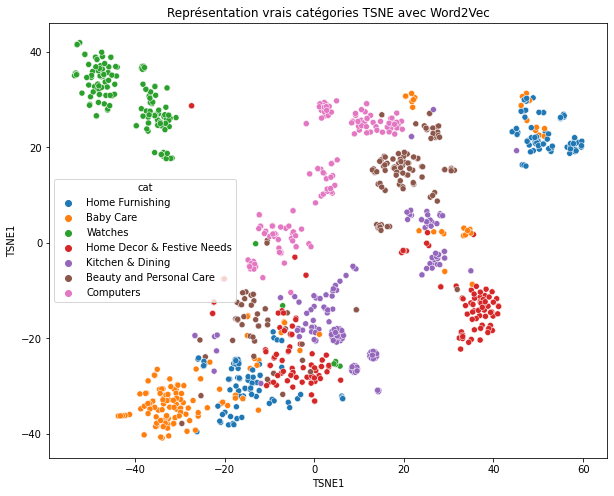

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


ARI : 0.4158808409866995


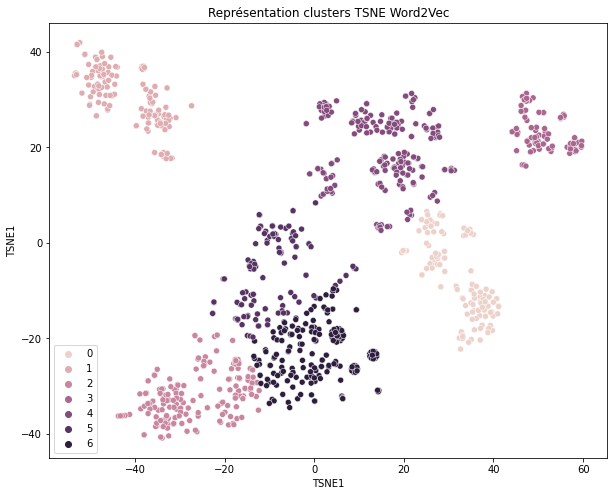

__________________


In [ ]:
for k in df_.drop('cat',axis=1).columns:
  docsVec = list()
  print('_______'+k+'_______')
  corpus_=[sent.split() for sent in df_[k].to_list()]#pour chaque document du corpus nettoyé
  for doc in corpus_:
    #calcul de son vecteur
    vec = my_doc_2_vec(doc,word_vectors)
    #ajouter dans la liste
    docsVec.append(vec)
#transformer en matrice numpy
  matVec = np.array(docsVec)
  print('shape vect bert',matVec.shape)
  scaler=StandardScaler()
  x_scal=scaler.fit_transform(matVec)
  pca=PCA(n_components=0.99)
  x_pca=pca.fit_transform(x_scal)
  print('shape pca bert',x_pca.shape)

  tsne=TSNE(n_components=2, perplexity=30, n_iter=2000, 
                                  init='random', learning_rate=200, random_state=42)
  x_tsne=tsne.fit_transform(x_pca)
  fig,ax=plt.subplots(figsize=(10,8))
  sns.scatterplot(x_tsne[:,0],x_tsne[:,1],hue=df.cat,ax=ax)
  ax.set_xlabel('TSNE1')
  ax.set_ylabel('TSNE1')
  plt.title('Représentation vrais catégories TSNE avec Word2Vec')
  plt.show()
  model1=KMeans(n_clusters=7,random_state=6)
  model1.fit(x_tsne)
  fig,ax=plt.subplots(figsize=(10,8))
  sns.scatterplot(x_tsne[:,0],x_tsne[:,1],hue=model1.labels_,ax=ax)
  ax.set_xlabel('TSNE1')
  ax.set_ylabel('TSNE1')
  plt.title('Représentation clusters TSNE Word2Vec')
  print('ARI :', adjusted_rand_score(df.cat,model1.labels_))
  plt.show()
  print('__________________')

## BERT 

On va s'attaquer à un des modèle issu de l'état de l'art qui est un transformer. Cela prend en compte le mechanisme d'attention permettant une notion de contexte encore plus puissant que les RNN ou LSTM. On utilise alors seulement la sortie du d'un état caché correspondant à une extraction de features. On va voir alors comment faire un "plongement" de séquence dans un espace afin de comparer 



### Bert avec huggingface

In [ ]:
from transformers import BertTokenizer, TFBertModel
import tensorflow as tf

tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")
model = TFBertModel.from_pretrained("bert-base-uncased")

Downloading:   0%|          | 0.00/226k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/570 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/511M [00:00<?, ?B/s]

Some layers from the model checkpoint at bert-base-uncased were not used when initializing TFBertModel: ['nsp___cls', 'mlm___cls']
- This IS expected if you are initializing TFBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
All the layers of TFBertModel were initialized from the model checkpoint at bert-base-uncased.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions without further training.


In [ ]:
l_seq=df.description.to_list()

In [ ]:
l_seq_low=[seq.lower() for seq in l_seq]

In [ ]:
def filt(seq):
  if len(seq.split(' '))>300:
    return ' '.join(seq.split(' ')[:300])
  else :
    return seq
      

In [ ]:
l_seq_low_filter=[filt(seq) for seq in l_seq_low ]

In [ ]:
l_seq_low_filter

In [ ]:
tokenizer(l_seq_low_filter)

Token indices sequence length is longer than the specified maximum sequence length for this model (577 > 512). Running this sequence through the model will result in indexing errors


{'input_ids': [[101, 3145, 2838, 1997, 27745, 26572, 20367, 4800, 18717, 10061, 3239, 7485, 2341, 11002, 18686, 11002, 1010, 27745, 26572, 20367, 4800, 18717, 10061, 3239, 7485, 2341, 11002, 1006, 19883, 4642, 1999, 4578, 1010, 5308, 1997, 1016, 1007, 3976, 1024, 12667, 1012, 6486, 2683, 2023, 11002, 11598, 2015, 1996, 2298, 1997, 1996, 20769, 1012, 2023, 11002, 2003, 2081, 2013, 2531, 1003, 2152, 3737, 26572, 20367, 8313, 1012, 2009, 2838, 2019, 3239, 7485, 2806, 26035, 2007, 3384, 3614, 1012, 2009, 3084, 1996, 2282, 4044, 6298, 1998, 8295, 1012, 2023, 11002, 2003, 14405, 1011, 23277, 19839, 2571, 1998, 3424, 22802, 4270, 1998, 2031, 11552, 10439, 20486, 3401, 1012, 2507, 2115, 2188, 1037, 4408, 1998, 19770, 2594, 5574, 2007, 2122, 5617, 1012, 1996, 16524, 3086, 2003, 2469, 2000, 8954, 8072, 1012, 2122, 3824, 3239, 7485, 1998, 11748, 6651, 14694, 7358, 15299, 2061, 2043, 2017, 4009, 2068, 4237, 2034, 2518, 1999, 1996, 2851, 2000, 6160, 1996, 4408, 3103, 9938, 2017, 2215, 2000, 4299, 2

In [ ]:
corpus_tokenised=tokenizer(l_seq_low_filter, return_tensors="tf",add_special_tokens=True,padding=True,max_length = 511)

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2302: UserWarning: `max_length` is ignored when `padding`=`True` and there is no truncation strategy. To pad to max length, use `padding='max_length'`.
  "`max_length` is ignored when `padding`=`True` and there is no truncation strategy. "


In [ ]:
corpus_tokenised

{'input_ids': <tf.Tensor: shape=(1050, 708), dtype=int32, numpy=
array([[  101,  3145,  2838, ...,     0,     0,     0],
       [  101, 15480,  1997, ...,     0,     0,     0],
       [  101,  3145,  2838, ...,     0,     0,     0],
       ...,
       [  101,  4965, 19169, ...,     0,     0,     0],
       [  101,  4965,  2813, ...,     0,     0,     0],
       [  101,  4965, 19169, ...,     0,     0,     0]], dtype=int32)>, 'token_type_ids': <tf.Tensor: shape=(1050, 708), dtype=int32, numpy=
array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int32)>, 'attention_mask': <tf.Tensor: shape=(1050, 708), dtype=int32, numpy=
array([[1, 1, 1, ..., 0, 0, 0],
       [1, 1, 1, ..., 0, 0, 0],
       [1, 1, 1, ..., 0, 0, 0],
       ...,
       [1, 1, 1, ..., 0, 0, 0],
       [1, 1, 1, ..., 0, 0, 0],
       [1, 1, 1, ..., 0, 0, 0]], dtype=in

In [ ]:
outputs=model(corpus_tokenised)

In [ ]:
inputs = tokenizer("Hello, my dog is cute", return_tensors="tf")
outputs = model(inputs)

last_hidden_states = outputs.last_hidden_state

In [ ]:
inputs = tokenizer(l_seq_low[0], return_tensors="tf")
outputs = model(inputs)

last_hidden_states = outputs.last_hidden_state


In [ ]:
model(inputs)

In [ ]:
last_hidden_states

In [ ]:

from time import time# Fonction de préparation des sentences
def bert_inp_fct(sentences, bert_tokenizer, max_length) :
    input_ids=[]
    token_type_ids = []
    attention_mask=[]
    bert_inp_tot = []

    for sent in sentences:
        bert_inp = bert_tokenizer.encode_plus(sent,
                                              add_special_tokens = True,
                                              max_length = max_length,
                                              padding='max_length',
                                              return_attention_mask = True, 
                                              return_token_type_ids=True,
                                              truncation=True,
                                              return_tensors="tf")
    
        input_ids.append(bert_inp['input_ids'][0])
        token_type_ids.append(bert_inp['token_type_ids'][0])
        attention_mask.append(bert_inp['attention_mask'][0])
        bert_inp_tot.append((bert_inp['input_ids'][0], 
                             bert_inp['token_type_ids'][0], 
                             bert_inp['attention_mask'][0]))

    input_ids = np.asarray(input_ids)
    token_type_ids = np.asarray(token_type_ids)
    attention_mask = np.array(attention_mask)
    
    return input_ids, token_type_ids, attention_mask, bert_inp_tot
    

# Fonction de création des features
def feature_BERT_fct(model, model_type, sentences, max_length, b_size, mode='HF') :
    batch_size = b_size
    batch_size_pred = b_size
    bert_tokenizer = tokenizer
    time1 = time()

    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        input_ids, token_type_ids, attention_mask, bert_inp_tot = bert_inp_fct(sentences[idx:idx+batch_size], 
                                                                      bert_tokenizer, max_length)
        
        if mode=='HF' :    # Bert HuggingFace
            outputs = model.predict([input_ids, attention_mask, token_type_ids], batch_size=batch_size_pred)
            last_hidden_states = outputs.last_hidden_state

        if mode=='TFhub' : # Bert Tensorflow Hub
            text_preprocessed = {"input_word_ids" : input_ids, 
                                 "input_mask" : attention_mask, 
                                 "input_type_ids" : token_type_ids}
            outputs = model(text_preprocessed)
            last_hidden_states = outputs['sequence_output']
             
        if step ==0 :
            last_hidden_states_tot = last_hidden_states
            last_hidden_states_tot_0 = last_hidden_states
        else :
            last_hidden_states_tot = np.concatenate((last_hidden_states_tot,last_hidden_states))
    
    features_bert = np.array(last_hidden_states_tot).mean(axis=1)
    
    time2 = np.round(time() - time1,0)
    print("temps traitement : ", time2)
     
    return features_bert, last_hidden_states_tot

In [ ]:
# Création des features

features_bert, last_hidden_states_tot = feature_BERT_fct(model, 'nothin', l_seq_low, 
                                                         64, 10, mode='HF')

1/1 [==============================] - 0s 21ms/step
temps traitement :  22.0


In [ ]:
features_bert.shape
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

shape vect bert (1050, 768)
shape pca bert (1050, 343)


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


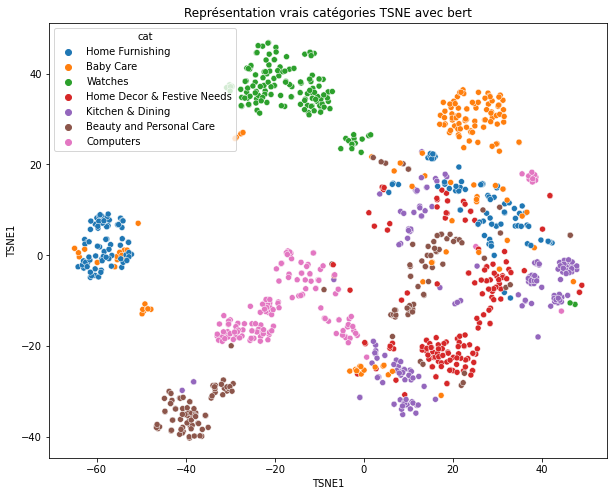

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


ARI : 0.40159782317538995


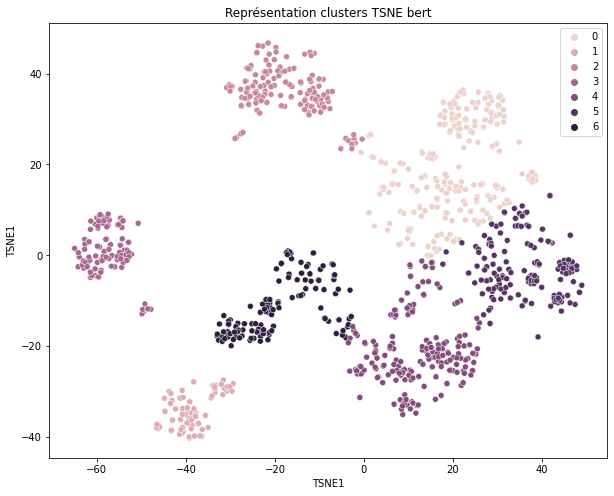

__________________


In [ ]:
  print('shape vect bert',features_bert.shape)
  scaler=StandardScaler()
  x_scal=scaler.fit_transform(features_bert)
  pca=PCA(n_components=0.99)
  x_pca=pca.fit_transform(x_scal)
  print('shape pca bert',x_pca.shape)

  tsne=TSNE(n_components=2, perplexity=30, n_iter=2000, 
                                  init='random', learning_rate=200, random_state=42)
  x_tsne=tsne.fit_transform(x_pca)
  fig,ax=plt.subplots(figsize=(10,8))
  sns.scatterplot(x_tsne[:,0],x_tsne[:,1],hue=df.cat,ax=ax)
  ax.set_xlabel('TSNE1')
  ax.set_ylabel('TSNE1')
  plt.title('Représentation vrais catégories TSNE avec bert')
  plt.show()
  model1=KMeans(n_clusters=7,random_state=6)
  model1.fit(x_tsne)
  fig,ax=plt.subplots(figsize=(10,8))
  sns.scatterplot(x_tsne[:,0],x_tsne[:,1],hue=model1.labels_,ax=ax)
  ax.set_xlabel('TSNE1')
  ax.set_ylabel('TSNE1')
  plt.title('Représentation clusters TSNE bert')
  print('ARI :', adjusted_rand_score(df.cat,model1.labels_))
  plt.show()
  print('__________________')

In [ ]:
# Création des features

features_bert, last_hidden_states_tot = feature_BERT_fct(model, 'nothin', l_seq_low, 
                                                         84, 150, mode='HF')

1/1 [==============================] - 1s 720ms/step
temps traitement :  17.0


shape vect bert (1050, 768)
shape pca bert (1050, 328)


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


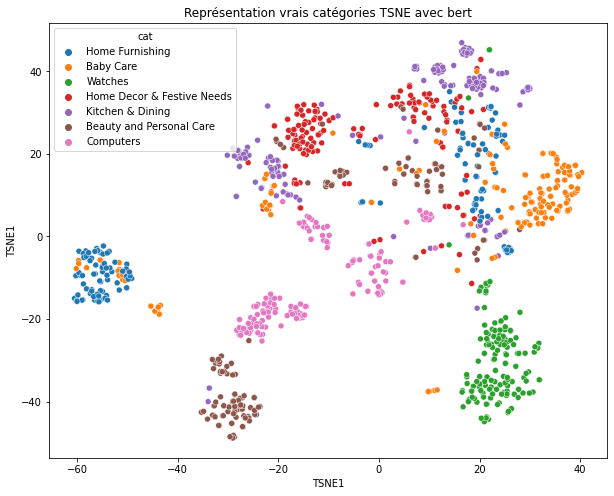

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


ARI : 0.3773767156485842


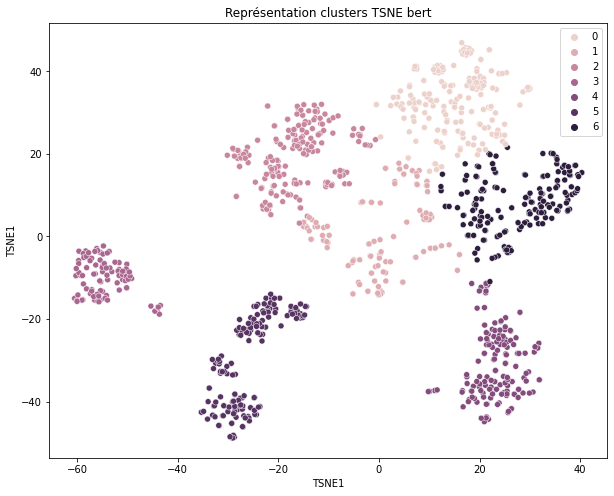

__________________


In [ ]:
  print('shape vect bert',features_bert.shape)
  scaler=StandardScaler()
  x_scal=scaler.fit_transform(features_bert)
  pca=PCA(n_components=0.99)
  x_pca=pca.fit_transform(x_scal)
  print('shape pca bert',x_pca.shape)

  tsne=TSNE(n_components=2, perplexity=30, n_iter=2000, 
                                  init='random', learning_rate=200, random_state=42)
  x_tsne=tsne.fit_transform(x_pca)
  fig,ax=plt.subplots(figsize=(10,8))
  sns.scatterplot(x_tsne[:,0],x_tsne[:,1],hue=df.cat,ax=ax)
  ax.set_xlabel('TSNE1')
  ax.set_ylabel('TSNE1')
  plt.title('Représentation vrais catégories TSNE avec bert')
  plt.show()
  model1=KMeans(n_clusters=7,random_state=6)
  model1.fit(x_tsne)
  fig,ax=plt.subplots(figsize=(10,8))
  sns.scatterplot(x_tsne[:,0],x_tsne[:,1],hue=model1.labels_,ax=ax)
  ax.set_xlabel('TSNE1')
  ax.set_ylabel('TSNE1')
  plt.title('Représentation clusters TSNE bert')
  print('ARI :', adjusted_rand_score(df.cat,model1.labels_))
  plt.show()
  print('__________________')

1/1 [==============================] - 0s 191ms/step
temps traitement :  7.0
shape vect bert (1050, 768)
shape pca bert (1050, 404)


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


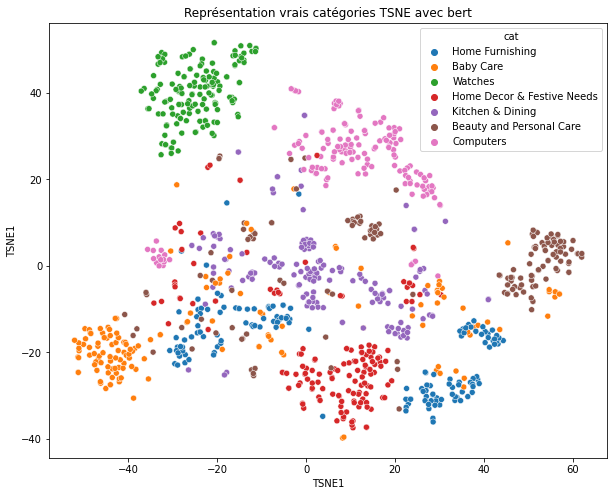

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


ARI : 0.44007321248714487


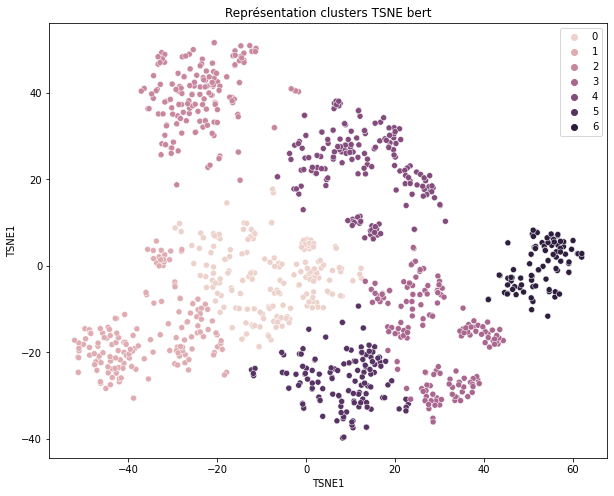

__________________


In [ ]:
  # Création des features

features_bert, last_hidden_states_tot = feature_BERT_fct(model, 'nothin', l_seq_low, 
                                                         20, 150, mode='HF')
  
  print('shape vect bert',features_bert.shape)
  scaler=StandardScaler()
  x_scal=scaler.fit_transform(features_bert)
  pca=PCA(n_components=0.99)
  x_pca=pca.fit_transform(x_scal)
  print('shape pca bert',x_pca.shape)

  tsne=TSNE(n_components=2, perplexity=30, n_iter=2000, 
                                  init='random', learning_rate=200, random_state=42)
  x_tsne=tsne.fit_transform(x_pca)
  fig,ax=plt.subplots(figsize=(10,8))
  sns.scatterplot(x_tsne[:,0],x_tsne[:,1],hue=df.cat,ax=ax)
  ax.set_xlabel('TSNE1')
  ax.set_ylabel('TSNE1')
  plt.title('Représentation vrais catégories TSNE avec bert')
  plt.show()
  model1=KMeans(n_clusters=7,random_state=6)
  model1.fit(x_tsne)
  fig,ax=plt.subplots(figsize=(10,8))
  sns.scatterplot(x_tsne[:,0],x_tsne[:,1],hue=model1.labels_,ax=ax)
  ax.set_xlabel('TSNE1')
  ax.set_ylabel('TSNE1')
  plt.title('Représentation clusters TSNE bert')
  print('ARI :', adjusted_rand_score(df.cat,model1.labels_))
  plt.show()
  print('__________________')

In [ ]:

# Tokenizer


def tokenizer_fct(sentence) :
    # print(sentence)
    sentence_clean = sentence.replace('-', ' ').replace('+',
                                                        ' ').replace('/', ' ').replace('#', ' ')
    word_tokens = word_tokenize(sentence_clean)
    return word_tokens

# Stop words
stop_w = list(set(stopwords.words('english'))) + ['[', ']', 
                                                  ',', '.', ':', '?', '(', ')']

def stop_word_filter_fct(list_words) :
    filtered_w = [w for w in list_words if not w in stop_w]
    filtered_w2 = [w for w in filtered_w if len(w) > 2]
    return filtered_w2

# lower case et alpha
def lower_start_fct(list_words) :
    lw = [w.lower() for w in list_words if (not w.startswith("@")) 
    #                                   and (not w.startswith("#"))
                                       and (not w.startswith("http"))]
    return lw

# Lemmatizer (base d'un mot)
from nltk.stem import WordNetLemmatizer

def lemma_fct(list_words) :
    lemmatizer = WordNetLemmatizer()
    lem_w = [lemmatizer.lemmatize(w) for w in list_words]
    return lem_w

# Fonction de préparation du texte pour le bag of words (Countvectorizer et Tf_idf, Word2Vec)
def transform_bow_fct(desc_text) :
    word_tokens = tokenizer_fct(desc_text)
    sw = stop_word_filter_fct(word_tokens)
    lw = lower_start_fct(sw)
    transf_desc_text = ' '.join(lw)
    return transf_desc_text

def transform_bow_lem_fct(desc_text) :
    word_tokens = tokenizer_fct(desc_text)
    sw = stop_word_filter_fct(word_tokens)
    lw = lower_start_fct(sw)
    lem_w = lemma_fct(lw)    
    transf_desc_text = ' '.join(lem_w)
    return transf_desc_text

def transform_dl_fct(desc_text) :
    word_tokens = tokenizer_fct(desc_text)
    lw = lower_start_fct(word_tokens)
    transf_desc_text = ' '.join(lw)
    return transf_desc_text
df_=df[['description','cat']].copy()
df_['sentence_bow'] = df['description'].apply(lambda x : transform_bow_fct(x))
df_['sentence_bow_lem'] = df['description'].apply(lambda x : transform_bow_lem_fct(x))
df_['sentence_dl'] = df['description'].apply(lambda x : transform_dl_fct(x))
df_.shape


(1050, 5)

--- description ---
1/1 [==============================] - 0s 192ms/step
temps traitement :  10.0
shape vect use (1050, 768)
shape pca use (1050, 404)


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


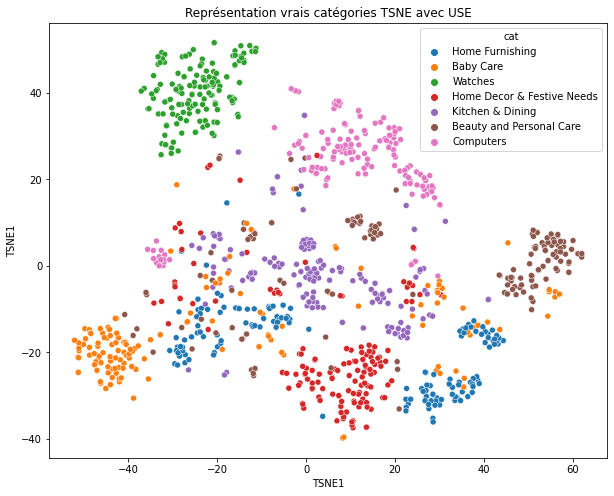

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


ARI : 0.44007321248714487


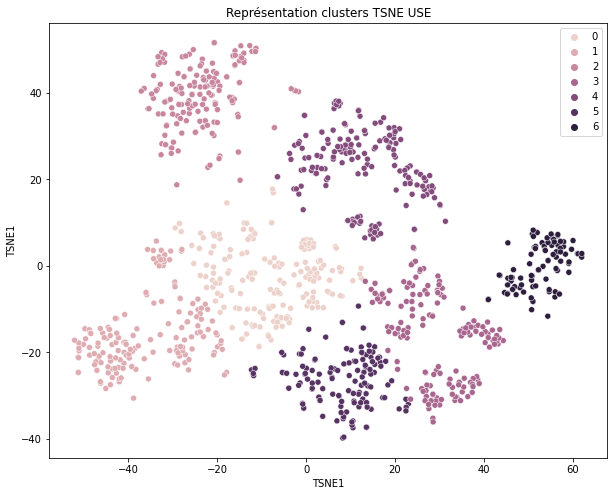

__________________
--- sentence_bow ---
1/1 [==============================] - 0s 193ms/step
temps traitement :  6.0
shape vect use (1050, 768)
shape pca use (1050, 404)


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


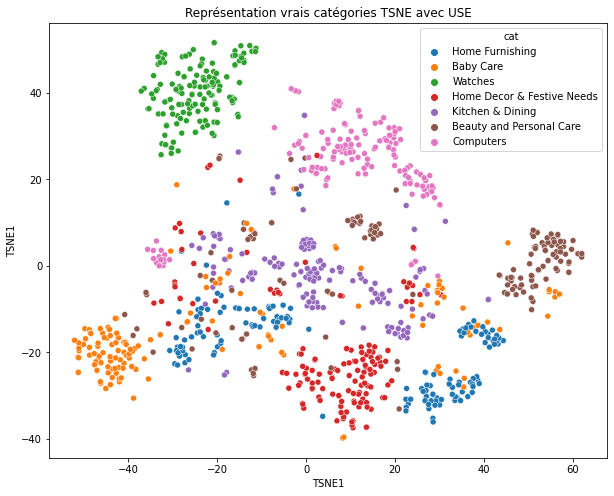

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


ARI : 0.44007321248714487


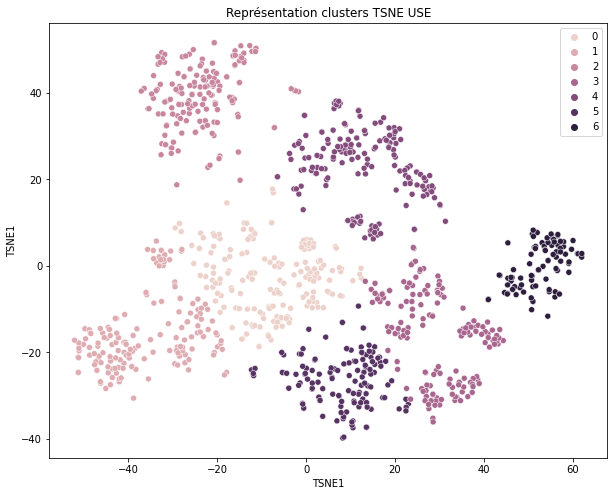

__________________
--- sentence_bow_lem ---
1/1 [==============================] - 0s 191ms/step
temps traitement :  6.0
shape vect use (1050, 768)
shape pca use (1050, 404)


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


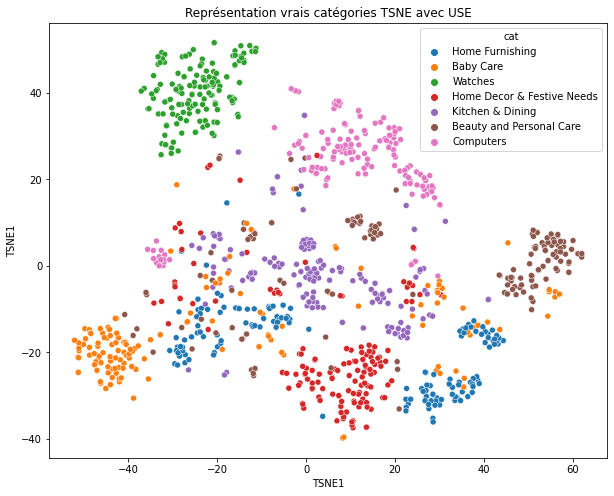

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


ARI : 0.44007321248714487


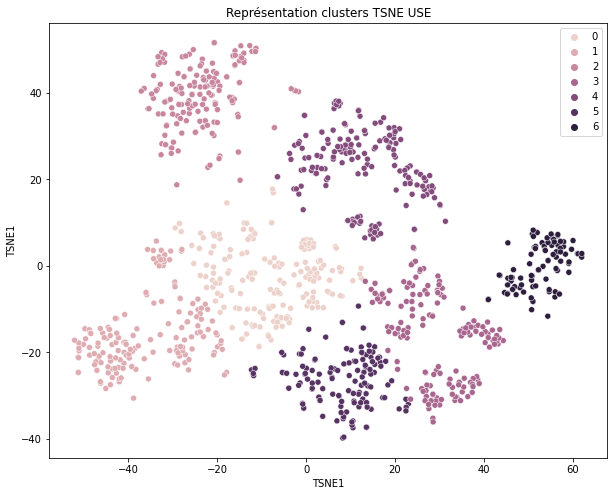

__________________
--- sentence_dl ---
1/1 [==============================] - 0s 199ms/step
temps traitement :  6.0
shape vect use (1050, 768)
shape pca use (1050, 404)


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


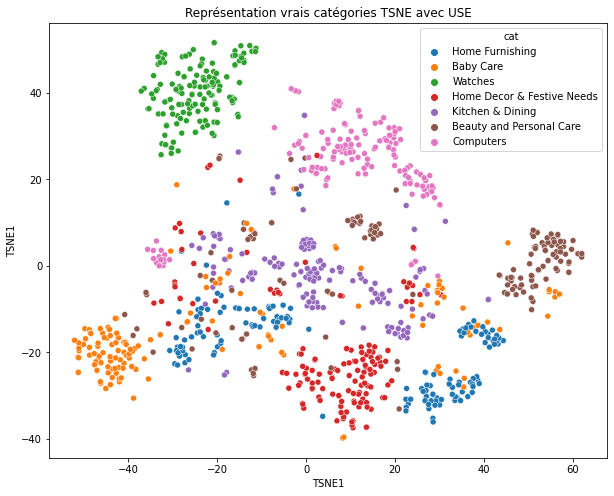

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


ARI : 0.44007321248714487


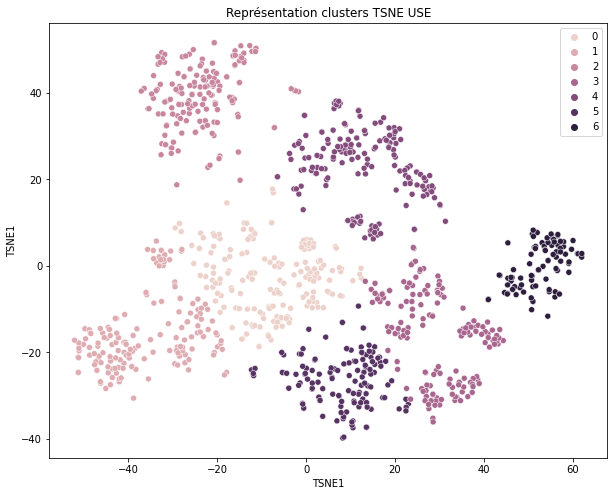

__________________


In [ ]:
"""
Juste un petit test ou j'ai bouclé avec différents perpexity et learning rate 
"""
for k in df_.drop('cat',axis=1).columns:
  print('---',k,'---')
  sentences=df_[k].to_list()
  vect_use, last_hidden_states_tot = feature_BERT_fct(model, 'nothin', l_seq_low, 
                                                         20, 150, mode='HF')
  print('shape vect use',vect_use.shape)
  scaler=StandardScaler()
  x_scal=scaler.fit_transform(vect_use)
  pca=PCA(n_components=0.99)
  x_pca=pca.fit_transform(x_scal)
  print('shape pca use',x_pca.shape)

  tsne=TSNE(n_components=2, perplexity=30, n_iter=2000, 
                                  init='random', learning_rate=200, random_state=42)
  x_tsne=tsne.fit_transform(x_pca)
  fig,ax=plt.subplots(figsize=(10,8))
  sns.scatterplot(x_tsne[:,0],x_tsne[:,1],hue=df.cat,ax=ax)
  ax.set_xlabel('TSNE1')
  ax.set_ylabel('TSNE1')
  plt.title('Représentation vrais catégories TSNE avec USE')
  plt.show()
  model1=KMeans(n_clusters=7,random_state=6)
  model1.fit(x_tsne)
  fig,ax=plt.subplots(figsize=(10,8))
  sns.scatterplot(x_tsne[:,0],x_tsne[:,1],hue=model1.labels_,ax=ax)
  ax.set_xlabel('TSNE1')
  ax.set_ylabel('TSNE1')
  plt.title('Représentation clusters TSNE USE')
  print('ARI :', adjusted_rand_score(df.cat,model1.labels_))
  plt.show()
  print('__________________')

1/1 [==============================] - 0s 194ms/step
temps traitement :  9.0
shape vect bert (1050, 768)


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


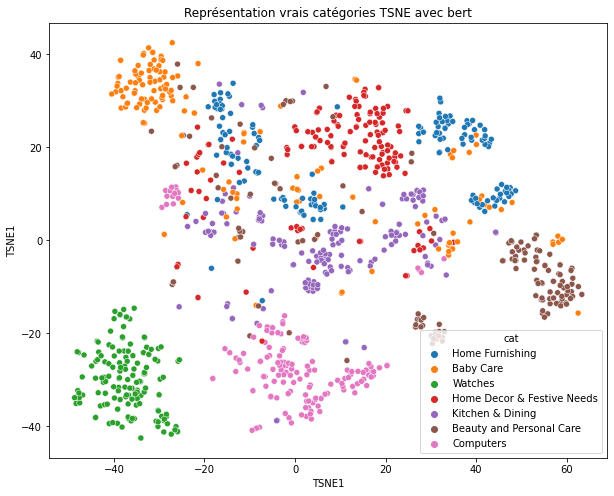

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


ARI : 0.4098779382648179


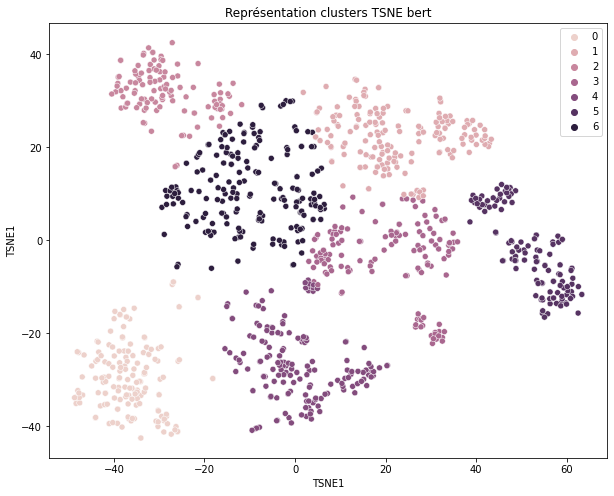

__________________


In [ ]:
  # Création des features

features_bert, last_hidden_states_tot = feature_BERT_fct(model, 'nothin', l_seq_low, 
                                                         20, 150, mode='HF')
  
  print('shape vect bert',features_bert.shape)


  tsne=TSNE(n_components=2, perplexity=30, n_iter=2000, 
                                  init='random', learning_rate=200, random_state=42)
  x_tsne=tsne.fit_transform(features_bert)
  fig,ax=plt.subplots(figsize=(10,8))
  sns.scatterplot(x_tsne[:,0],x_tsne[:,1],hue=df.cat,ax=ax)
  ax.set_xlabel('TSNE1')
  ax.set_ylabel('TSNE1')
  plt.title('Représentation vrais catégories TSNE avec bert')
  plt.show()
  model1=KMeans(n_clusters=7,random_state=6)
  model1.fit(x_tsne)
  fig,ax=plt.subplots(figsize=(10,8))
  sns.scatterplot(x_tsne[:,0],x_tsne[:,1],hue=model1.labels_,ax=ax)
  ax.set_xlabel('TSNE1')
  ax.set_ylabel('TSNE1')
  plt.title('Représentation clusters TSNE bert')
  print('ARI :', adjusted_rand_score(df.cat,model1.labels_))
  plt.show()
  print('__________________')

In [ ]:
"""mieux comprendre les sorties"""
model(tokenizer.encode_plus("mais explique moi à quoi ca correspond",
                                              add_special_tokens = True,
                                              max_length = 84,
                                              padding='max_length',
                                              return_attention_mask = True, 
                                              return_token_type_ids=True,
                                              truncation=True,
                                              return_tensors="tf"))

### test bert avec Spacy

In [ ]:
!pip install spacy_sentence_bert
!pip install https://github.com/MartinoMensio/spacy-sentence-bert/releases/download/v0.1.2/en_stsb_roberta_large-0.1.2.tar.gz#en_stsb_roberta_large-0.1.2

In [ ]:
import spacy_sentence_bert

In [ ]:
nlp = spacy_sentence_bert.load_model('en_stsb_roberta_large')
# get two documents
doc_1 = nlp('Hi there, how are you?')
doc_2 = nlp('Hello there, how are you doing today?')
# use the similarity method that is based on the vectors, on Doc, Span or Token
print(doc_1.similarity(doc_2[0:7]))

Downloading:   0%|          | 0.00/748 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/191 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/3.92k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/2.00 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/674 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/122 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/456k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/229 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.42G [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/52.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/239 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.17k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/798k [00:00<?, ?B/s]

0.749161531331056


In [ ]:
doc_1.vector.shape,doc_2.vector.shape

((1024,), (1024,))

In [ ]:
lst=[]
m=0
for sent in l_seq_low:
  lst.append(nlp(sent).vector)
  if m%100==0: print(m)
  m+=1

0
100
200
300
400
500
600
700
800
900
1000


In [ ]:
df_=pd.DataFrame(lst)

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [ ]:
scaler=StandardScaler()
x_scal=scaler.fit_transform(df_)

In [ ]:
pca=PCA(n_components=0.99)
x_pca=pca.fit_transform(x_scal)
x_pca.shapea

(1050, 353)

In [ ]:
from sklearn.cluster import KMeans

In [ ]:
model1=KMeans(n_clusters=7,random_state=6)
model1.fit(x_pca)

KMeans(n_clusters=7, random_state=6)

In [ ]:
from sklearn.metrics import adjusted_rand_score

In [ ]:
adjusted_rand_score(model1.labels_,df.cat)#pas top mais si on fait un petit tsne avant hehe

0.31990316765176796

In [ ]:
from sklearn.manifold import TSNE

In [ ]:
tsne=TSNE(n_components=2, perplexity=30, n_iter=2000, 
                                 init='random', learning_rate=200, random_state=42)
x_tsne=tsne.fit_transform(x_pca)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0.5, 1.0, 'Représentation vrais catégories TSNE')

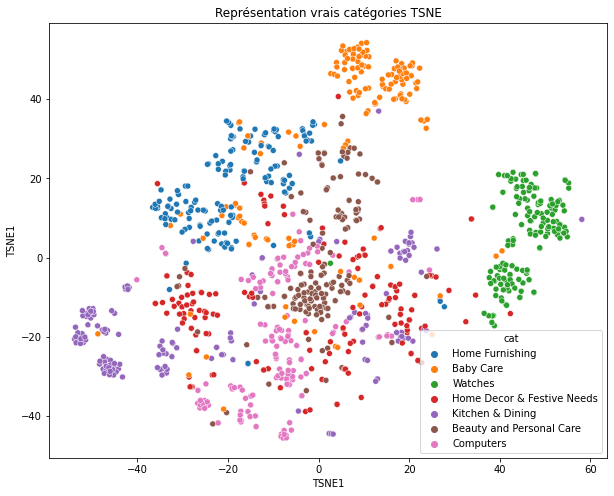

In [ ]:
fig,ax=plt.subplots(figsize=(10,8))
sns.scatterplot(x_tsne[:,0],x_tsne[:,1],hue=df.cat,ax=ax)
ax.set_xlabel('TSNE1')
ax.set_ylabel('TSNE1')
plt.title('Représentation vrais catégories TSNE')

In [ ]:
model1=KMeans(n_clusters=7,random_state=6)
model1.fit(x_tsne)

KMeans(n_clusters=7, random_state=6)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0.5, 1.0, 'Représentation clusters TSNE')

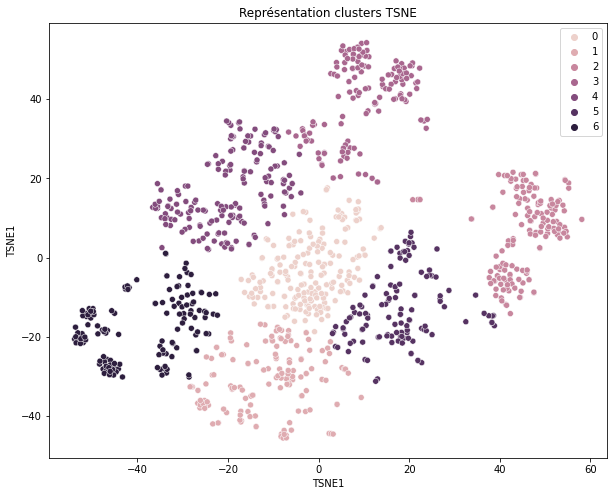

In [ ]:
fig,ax=plt.subplots(figsize=(10,8))
sns.scatterplot(x_tsne[:,0],x_tsne[:,1],hue=model1.labels_,ax=ax)
ax.set_xlabel('TSNE1')
ax.set_ylabel('TSNE1')
plt.title('Représentation clusters TSNE')

In [ ]:
adjusted_rand_score(df.cat,model1.labels_)

0.43866182172584073

## Universal Sentence Encoder USE

In [ ]:
import tensorflow_hub as hub
  
embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")
  

In [ ]:
vect_use=embed(l_seq)

In [ ]:
vect_use.shape

TensorShape([1050, 512])

In [ ]:
pca=PCA(n_components=0.99)
x_pca=pca.fit_transform(vect_use)
x_pca.shape

(1050, 308)

In [ ]:
tsne=TSNE(n_components=2, perplexity=30, n_iter=2000, 
                                 init='random', learning_rate=200, random_state=42)
x_tsne=tsne.fit_transform(x_pca)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0.5, 1.0, 'Représentation vrais catégories TSNE avec USE')

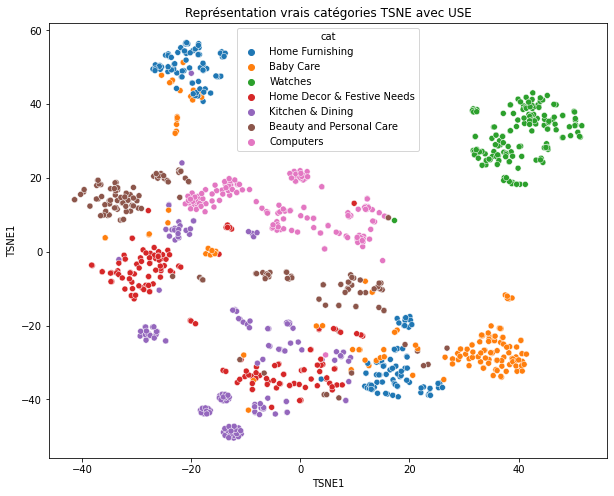

In [ ]:
fig,ax=plt.subplots(figsize=(10,8))
sns.scatterplot(x_tsne[:,0],x_tsne[:,1],hue=df.cat,ax=ax)
ax.set_xlabel('TSNE1')
ax.set_ylabel('TSNE1')
plt.title('Représentation vrais catégories TSNE avec USE')

In [ ]:
model1=KMeans(n_clusters=7,random_state=6)
model1.fit(x_tsne)

KMeans(n_clusters=7, random_state=6)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0.5, 1.0, 'Représentation clusters TSNE USE')

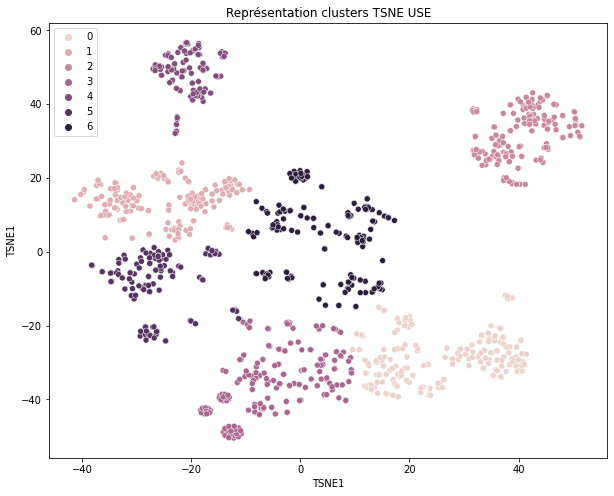

In [ ]:
fig,ax=plt.subplots(figsize=(10,8))
sns.scatterplot(x_tsne[:,0],x_tsne[:,1],hue=model1.labels_,ax=ax)
ax.set_xlabel('TSNE1')
ax.set_ylabel('TSNE1')
plt.title('Représentation clusters TSNE USE')

In [ ]:
adjusted_rand_score(df.cat,model1.labels_)

0.4526513574031529

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


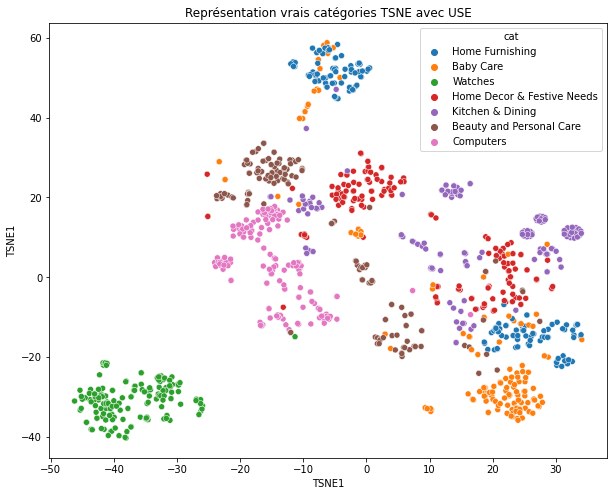

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


ARI : 0.41637016242299735


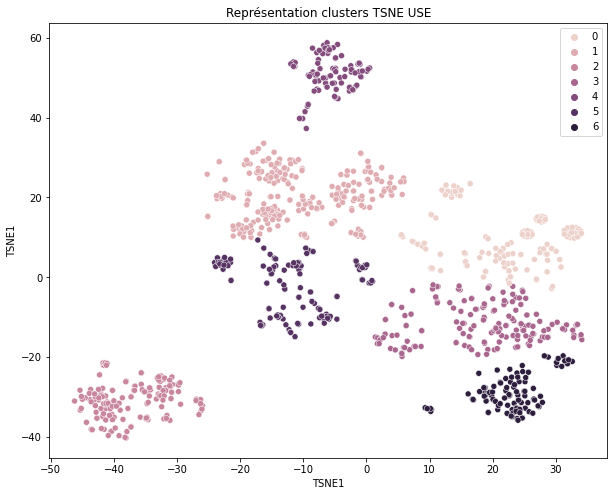

In [ ]:
"""
Juste un petit test ou j'ai bouclé avec différents perpexity et learning rate 
"""

tsne=TSNE(n_components=2, perplexity=40, n_iter=2000, 
                                 init='random', learning_rate=300, random_state=42)
x_tsne=tsne.fit_transform(x_pca)
fig,ax=plt.subplots(figsize=(10,8))
sns.scatterplot(x_tsne[:,0],x_tsne[:,1],hue=df.cat,ax=ax)
ax.set_xlabel('TSNE1')
ax.set_ylabel('TSNE1')
plt.title('Représentation vrais catégories TSNE avec USE')
plt.show()
model1=KMeans(n_clusters=7,random_state=6)
model1.fit(x_tsne)
fig,ax=plt.subplots(figsize=(10,8))
sns.scatterplot(x_tsne[:,0],x_tsne[:,1],hue=model1.labels_,ax=ax)
ax.set_xlabel('TSNE1')
ax.set_ylabel('TSNE1')
plt.title('Représentation clusters TSNE USE')
print('ARI :', adjusted_rand_score(df.cat,model1.labels_))

In [ ]:

# Tokenizer
import nltk
nltk.download('omw-1.4')
from nltk.corpus import stopwords

from nltk.tokenize import sent_tokenize, word_tokenize

def tokenizer_fct(sentence) :
    # print(sentence)
    sentence_clean = sentence.replace('-', ' ').replace('+',
                                                        ' ').replace('/', ' ').replace('#', ' ')
    word_tokens = word_tokenize(sentence_clean)
    return word_tokens

# Stop words
stop_w = list(set(stopwords.words('english'))) + ['[', ']', 
                                                  ',', '.', ':', '?', '(', ')']

def stop_word_filter_fct(list_words) :
    filtered_w = [w for w in list_words if not w in stop_w]
    filtered_w2 = [w for w in filtered_w if len(w) > 2]
    return filtered_w2

# lower case et alpha
def lower_start_fct(list_words) :
    lw = [w.lower() for w in list_words if (not w.startswith("@")) 
    #                                   and (not w.startswith("#"))
                                       and (not w.startswith("http"))]
    return lw

# Lemmatizer (base d'un mot)
from nltk.stem import WordNetLemmatizer

def lemma_fct(list_words) :
    lemmatizer = WordNetLemmatizer()
    lem_w = [lemmatizer.lemmatize(w) for w in list_words]
    return lem_w

# Fonction de préparation du texte pour le bag of words (Countvectorizer et Tf_idf, Word2Vec)
def transform_bow_fct(desc_text) :
    word_tokens = tokenizer_fct(desc_text)
    sw = stop_word_filter_fct(word_tokens)
    lw = lower_start_fct(sw)
    transf_desc_text = ' '.join(lw)
    return transf_desc_text

def transform_bow_lem_fct(desc_text) :
    word_tokens = tokenizer_fct(desc_text)
    sw = stop_word_filter_fct(word_tokens)
    lw = lower_start_fct(sw)
    lem_w = lemma_fct(lw)    
    transf_desc_text = ' '.join(lem_w)
    return transf_desc_text

def transform_dl_fct(desc_text) :
    word_tokens = tokenizer_fct(desc_text)
    lw = lower_start_fct(word_tokens)
    transf_desc_text = ' '.join(lw)
    return transf_desc_text
df_=df[['description','cat']].copy()
df_['sentence_bow'] = df['description'].apply(lambda x : transform_bow_fct(x))
df_['sentence_bow_lem'] = df['description'].apply(lambda x : transform_bow_lem_fct(x))
df_['sentence_dl'] = df['description'].apply(lambda x : transform_dl_fct(x))
df_.shape


[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


(1050, 5)

--- description ---
shape vect use (1050, 512)
shape pca use (1050, 313)


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


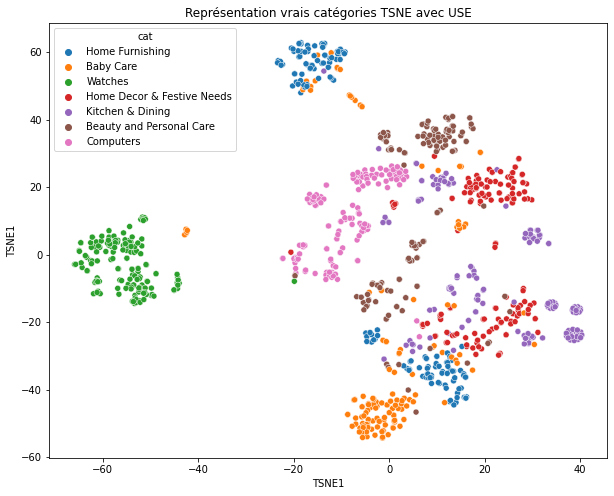

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


ARI : 0.4357811617256905


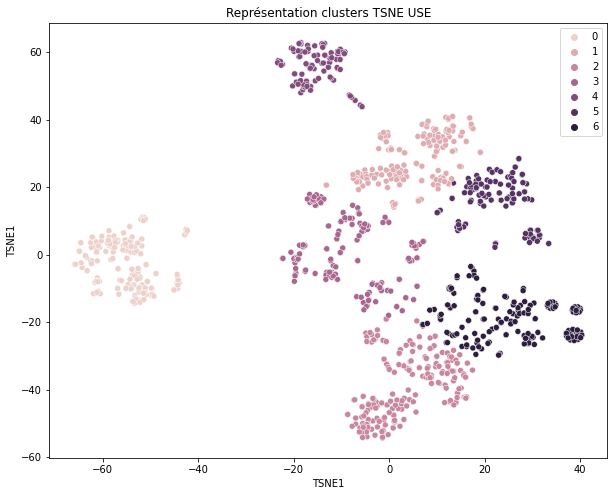

__________________
--- sentence_bow ---
shape vect use (1050, 512)
shape pca use (1050, 326)


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


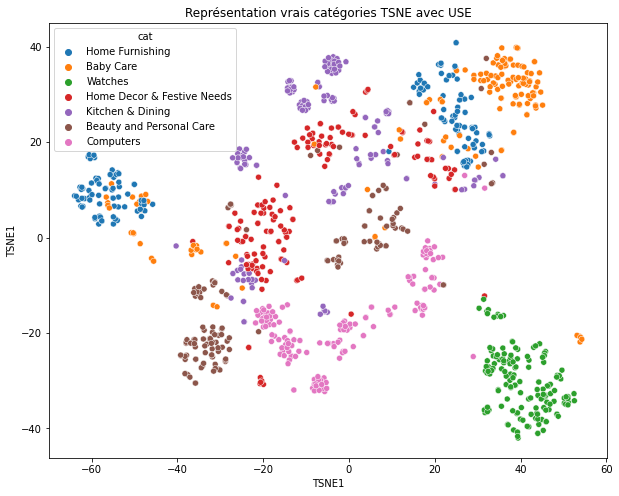

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


ARI : 0.4121540935711716


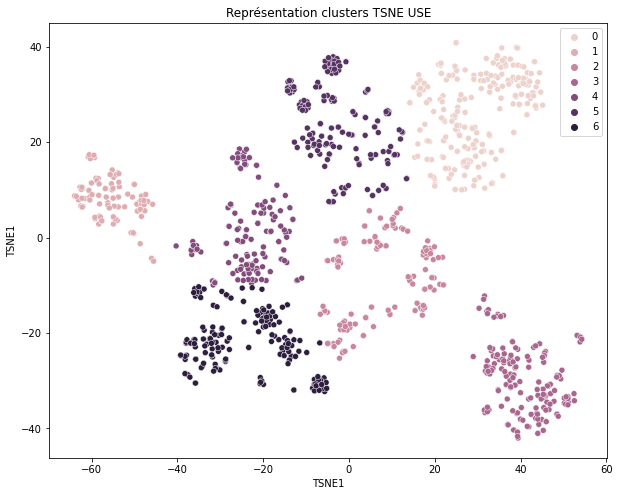

__________________
--- sentence_bow_lem ---
shape vect use (1050, 512)
shape pca use (1050, 326)


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


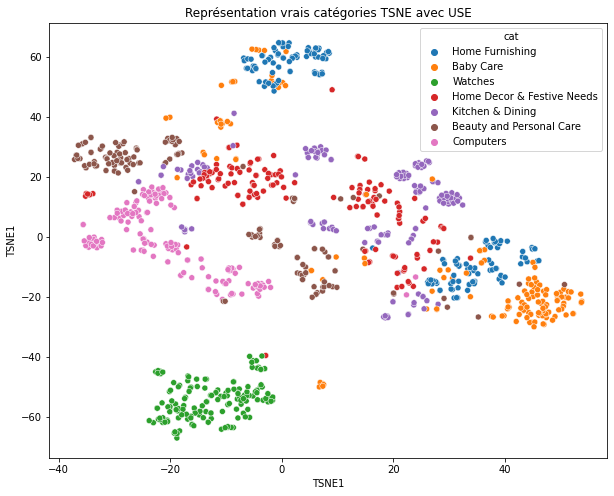

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


ARI : 0.40210711695062523


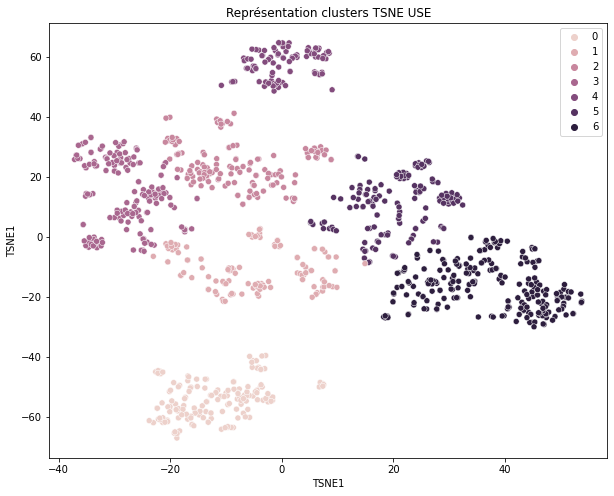

__________________
--- sentence_dl ---
shape vect use (1050, 512)
shape pca use (1050, 318)


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


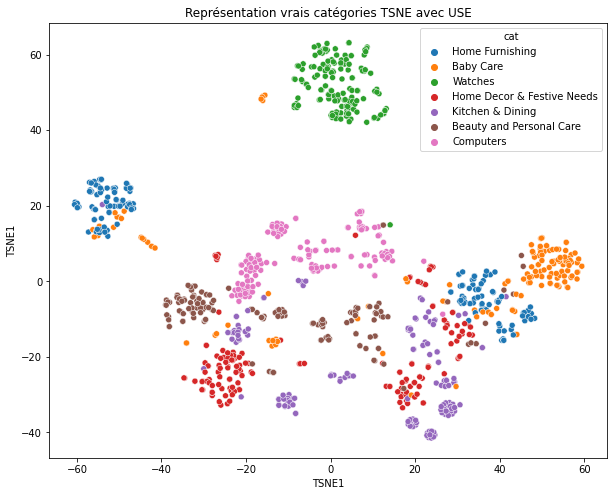

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


ARI : 0.43582245190583707


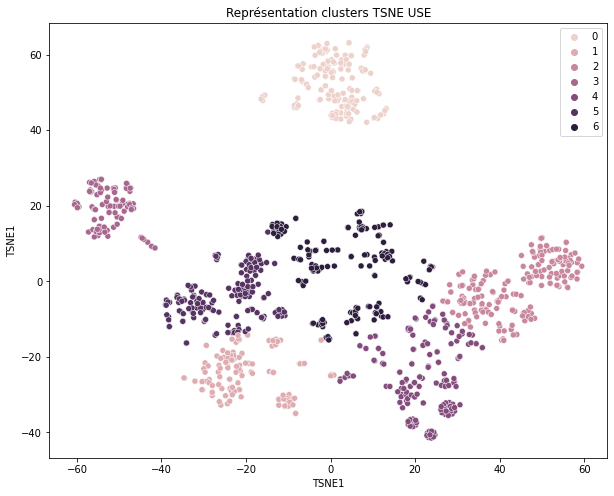

__________________


In [ ]:
"""
Juste un petit test ou j'ai bouclé avec différents perpexity et learning rate 
"""
for k in df_.drop('cat',axis=1).columns:
  print('---',k,'---')
  sentences=df_[k].to_list()
  vect_use=embed(sentences)
  print('shape vect use',vect_use.shape)
  scaler=StandardScaler()
  x_scal=scaler.fit_transform(vect_use)
  pca=PCA(n_components=0.99)
  x_pca=pca.fit_transform(x_scal)
  print('shape pca use',x_pca.shape)

  tsne=TSNE(n_components=2, perplexity=30, n_iter=2000, 
                                  init='random', learning_rate=200, random_state=42)
  x_tsne=tsne.fit_transform(x_pca)
  fig,ax=plt.subplots(figsize=(10,8))
  sns.scatterplot(x_tsne[:,0],x_tsne[:,1],hue=df.cat,ax=ax)
  ax.set_xlabel('TSNE1')
  ax.set_ylabel('TSNE1')
  plt.title('Représentation vrais catégories TSNE avec USE')
  plt.show()
  model1=KMeans(n_clusters=7,random_state=6)
  model1.fit(x_tsne)
  fig,ax=plt.subplots(figsize=(10,8))
  sns.scatterplot(x_tsne[:,0],x_tsne[:,1],hue=model1.labels_,ax=ax)
  ax.set_xlabel('TSNE1')
  ax.set_ylabel('TSNE1')
  plt.title('Représentation clusters TSNE USE')
  print('ARI :', adjusted_rand_score(df.cat,model1.labels_))
  plt.show()
  print('__________________')

--- description ---
shape vect use (1050, 512)


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


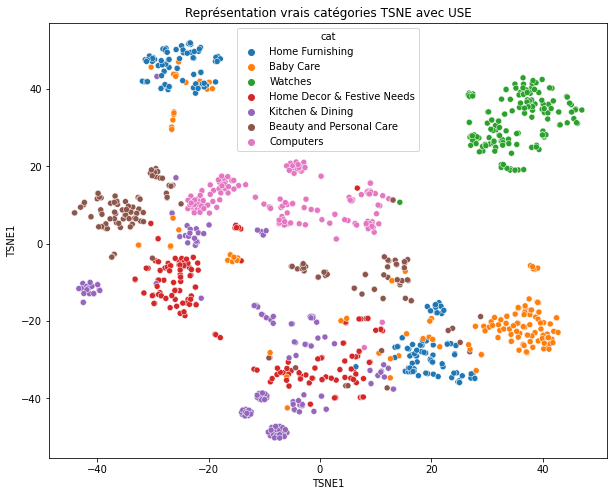

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


ARI : 0.44633527329409994


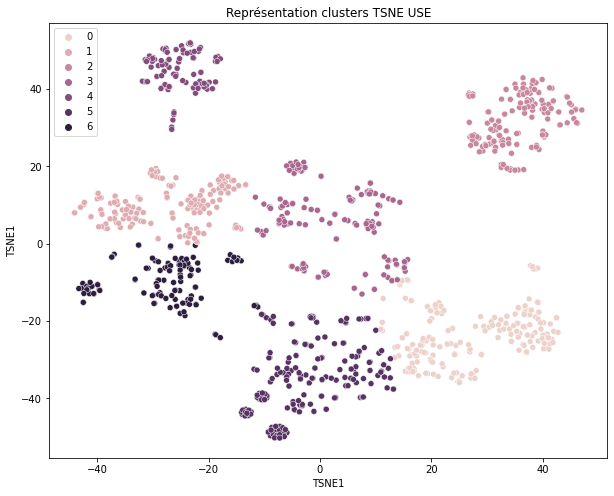

__________________
--- sentence_bow ---
shape vect use (1050, 512)


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


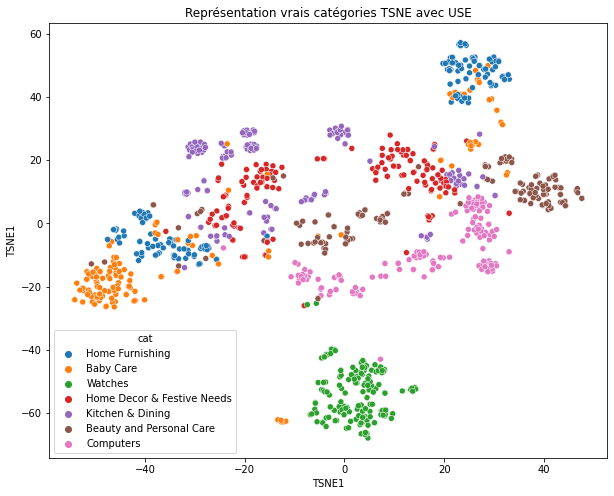

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


ARI : 0.42787225032076176


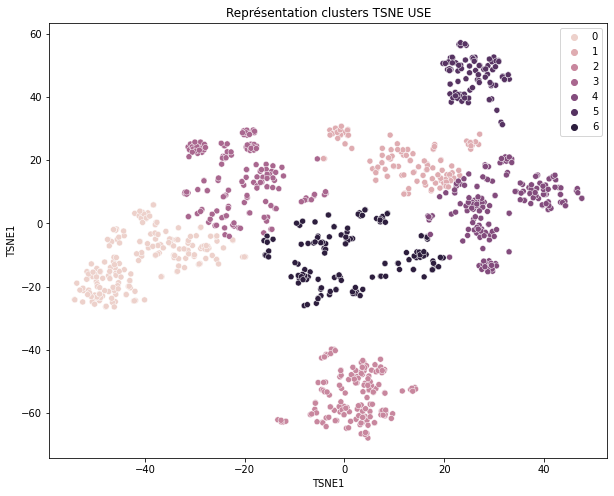

__________________
--- sentence_bow_lem ---
shape vect use (1050, 512)


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


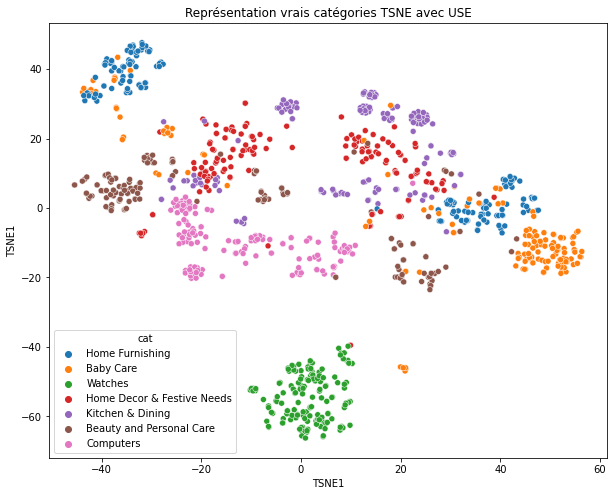

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


ARI : 0.41636102313492757


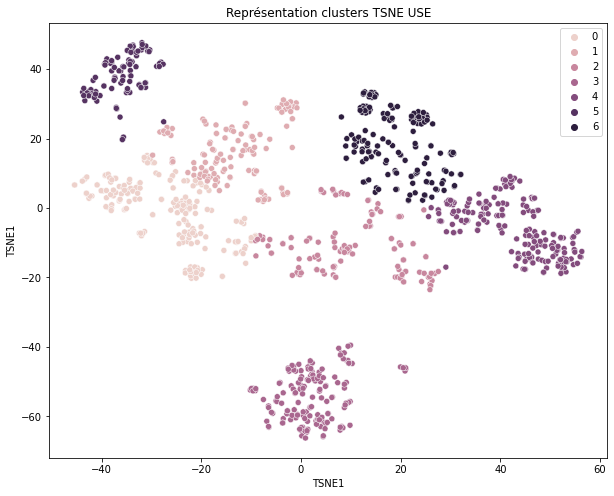

__________________
--- sentence_dl ---
shape vect use (1050, 512)


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


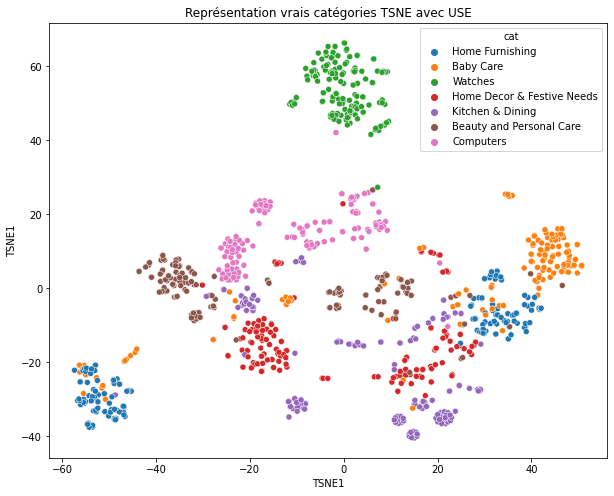

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


ARI : 0.4431316612011703


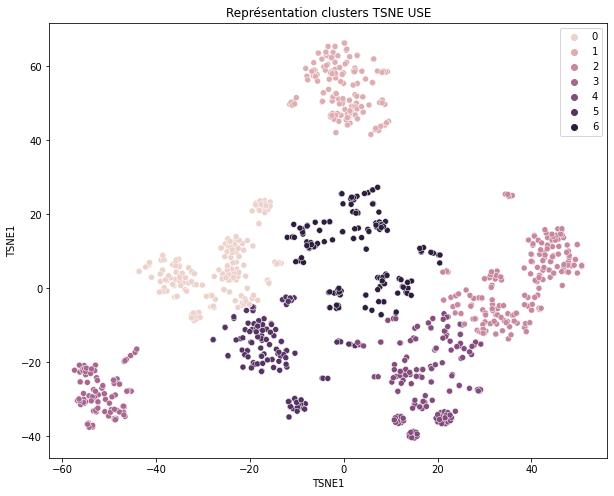

__________________


In [ ]:
"""
Juste un petit test ou j'ai bouclé avec différents perpexity et learning rate 
"""
for k in df_.drop('cat',axis=1).columns:
  print('---',k,'---')
  sentences=df_[k].to_list()
  vect_use=embed(sentences)
  print('shape vect use',vect_use.shape)

  tsne=TSNE(n_components=2, perplexity=30, n_iter=2000, 
                                  init='random', learning_rate=200, random_state=42)
  x_tsne=tsne.fit_transform(vect_use)
  fig,ax=plt.subplots(figsize=(10,8))
  sns.scatterplot(x_tsne[:,0],x_tsne[:,1],hue=df.cat,ax=ax)
  ax.set_xlabel('TSNE1')
  ax.set_ylabel('TSNE1')
  plt.title('Représentation vrais catégories TSNE avec USE')
  plt.show()
  model1=KMeans(n_clusters=7,random_state=6)
  model1.fit(x_tsne)
  fig,ax=plt.subplots(figsize=(10,8))
  sns.scatterplot(x_tsne[:,0],x_tsne[:,1],hue=model1.labels_,ax=ax)
  ax.set_xlabel('TSNE1')
  ax.set_ylabel('TSNE1')
  plt.title('Représentation clusters TSNE USE')
  print('ARI :', adjusted_rand_score(df.cat,model1.labels_))
  plt.show()
  print('__________________')

In [ ]:
df_.head()

,description,cat,sentence_bow,sentence_bow_lem,sentence_dl
0,Key Features of Elegance Polyester Multicolor ...,Home Furnishing,key features elegance polyester multicolor abs...,key feature elegance polyester multicolor abst...,key features of elegance polyester multicolor ...
1,Specifications of Sathiyas Cotton Bath Towel (...,Baby Care,specifications sathiyas cotton bath towel bath...,specification sathiyas cotton bath towel bath ...,specifications of sathiyas cotton bath towel (...
2,Key Features of Eurospa Cotton Terry Face Towe...,Baby Care,key features eurospa cotton terry face towel s...,key feature eurospa cotton terry face towel se...,key features of eurospa cotton terry face towe...
3,Key Features of SANTOSH ROYAL FASHION Cotton P...,Home Furnishing,key features santosh royal fashion cotton prin...,key feature santosh royal fashion cotton print...,key features of santosh royal fashion cotton p...
4,Key Features of Jaipur Print Cotton Floral Kin...,Home Furnishing,key features jaipur print cotton floral king s...,key feature jaipur print cotton floral king si...,key features of jaipur print cotton floral kin...


## SBERT


In [ ]:
pip install -U sentence-transformers


In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

--- description ---
shape vect use (1050, 384)


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


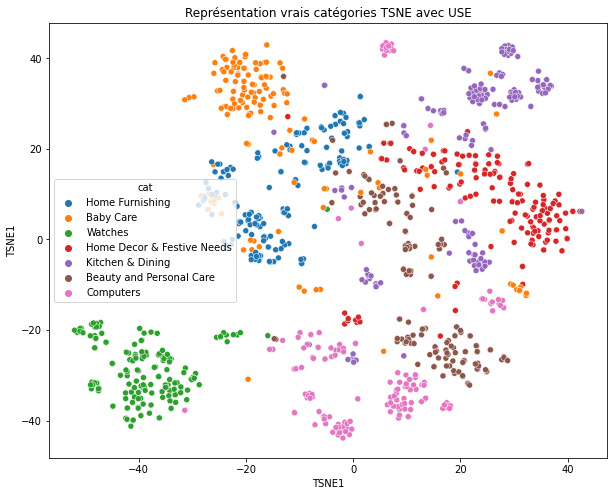

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


ARI : 0.45318391632697586


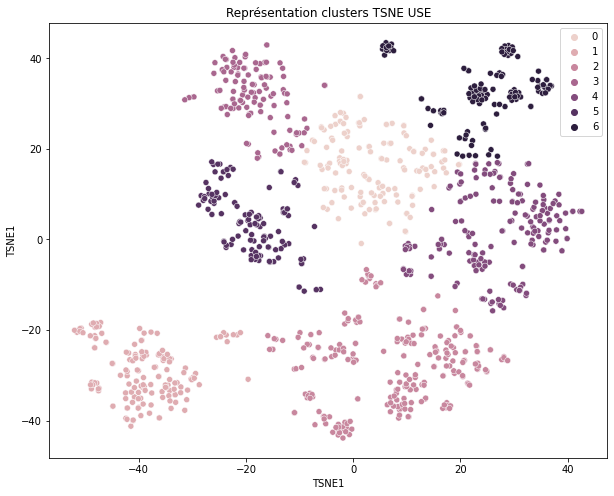

__________________
--- sentence_bow ---
shape vect use (1050, 384)


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


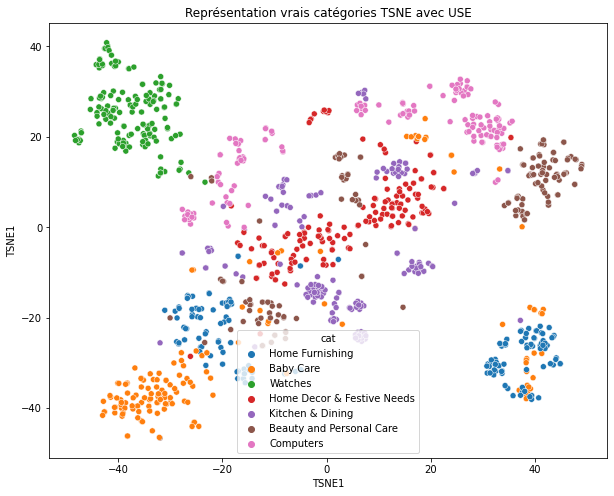

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


ARI : 0.36720503338740135


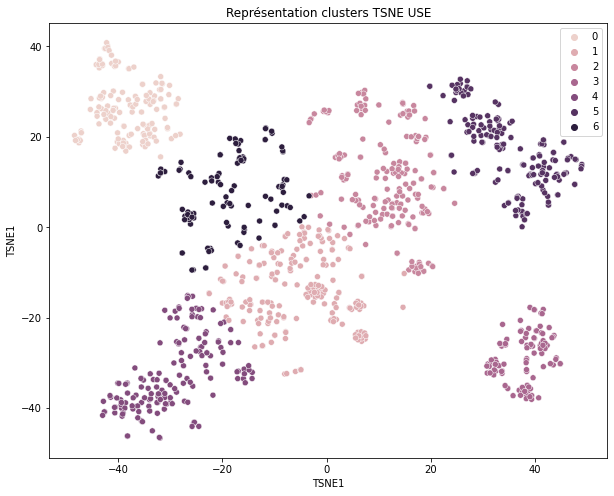

__________________
--- sentence_bow_lem ---
shape vect use (1050, 384)


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


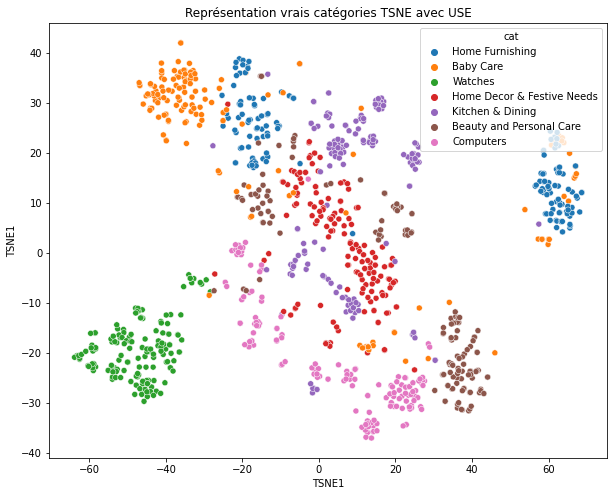

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


ARI : 0.3936777089811237


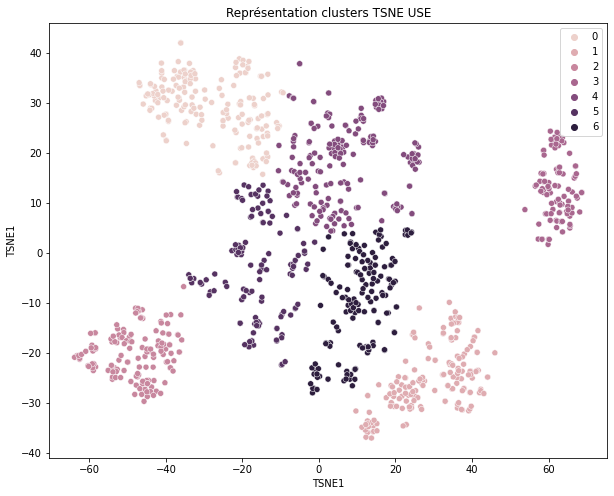

__________________
--- sentence_dl ---
shape vect use (1050, 384)


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


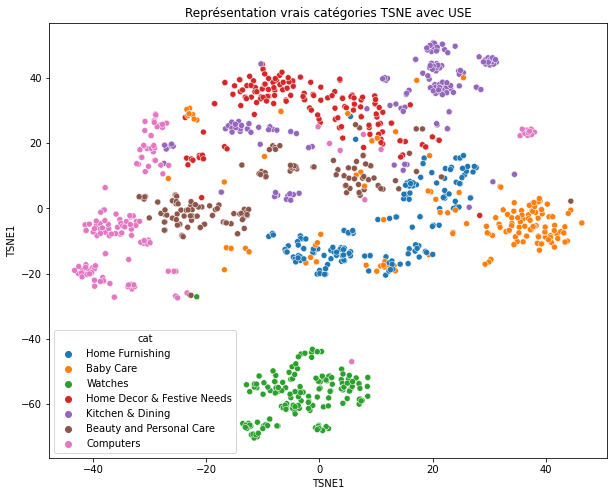

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


ARI : 0.4437330254770382


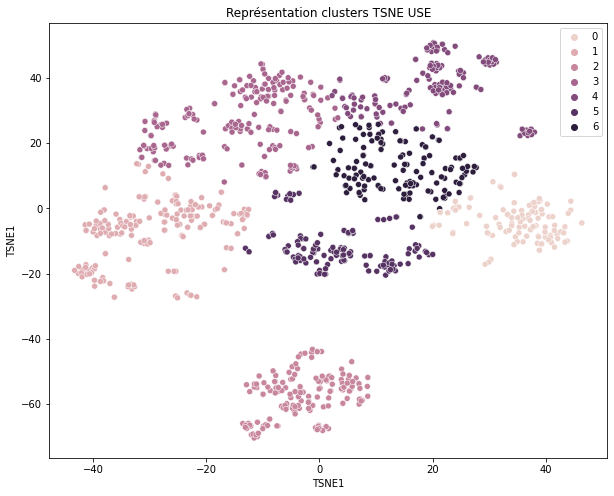

__________________


In [ ]:
"""
Juste un petit test ou j'ai bouclé avec différents perpexity et learning rate 
"""
from sentence_transformers import SentenceTransformer
model = SentenceTransformer('paraphrase-MiniLM-L6-v2')
for k in df_.drop('cat',axis=1).columns:
  print('---',k,'---')
  sentences=df_[k].to_list()
  vect_use=model.encode(sentences)
  print('shape vect use',vect_use.shape)

  tsne=TSNE(n_components=2, perplexity=30, n_iter=2000, 
                                  init='random', learning_rate=200, random_state=42)
  x_tsne=tsne.fit_transform(vect_use)
  fig,ax=plt.subplots(figsize=(10,8))
  sns.scatterplot(x_tsne[:,0],x_tsne[:,1],hue=df.cat,ax=ax)
  ax.set_xlabel('TSNE1')
  ax.set_ylabel('TSNE1')
  plt.title('Représentation vrais catégories TSNE avec USE')
  plt.show()
  model1=KMeans(n_clusters=7,random_state=6)
  model1.fit(x_tsne)
  fig,ax=plt.subplots(figsize=(10,8))
  sns.scatterplot(x_tsne[:,0],x_tsne[:,1],hue=model1.labels_,ax=ax)
  ax.set_xlabel('TSNE1')
  ax.set_ylabel('TSNE1')
  plt.title('Représentation clusters TSNE USE')
  print('ARI :', adjusted_rand_score(df.cat,model1.labels_))
  plt.show()
  print('__________________')

Downloading:   0%|          | 0.00/1.18k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/190 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/10.1k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/571 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/116 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/39.3k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/349 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/438M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/239 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/363 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/13.1k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

--- description ---
shape vect use (1050, 768)


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


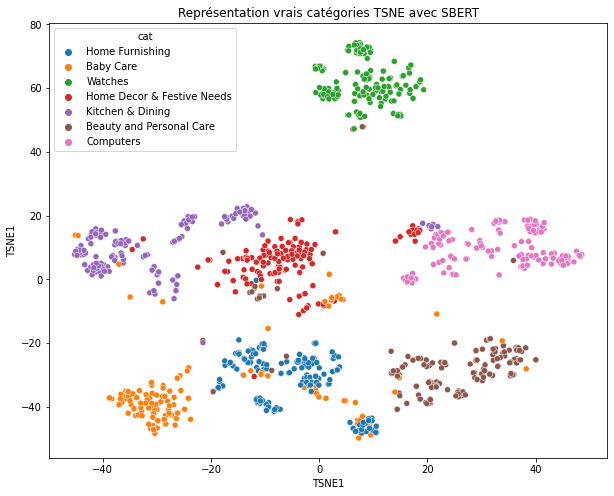

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


ARI : 0.7391129054717829


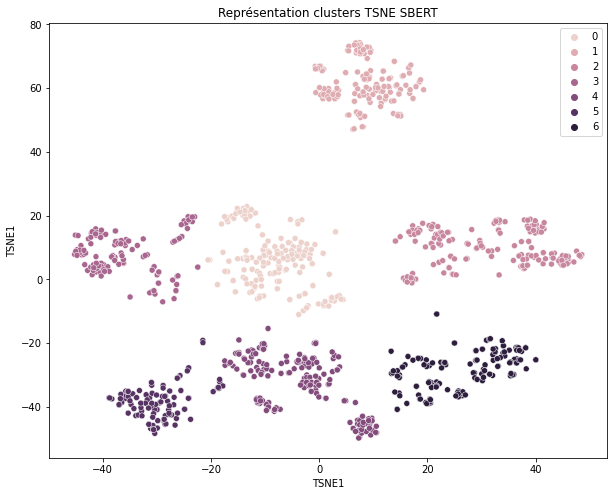

__________________
--- sentence_bow ---
shape vect use (1050, 768)


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


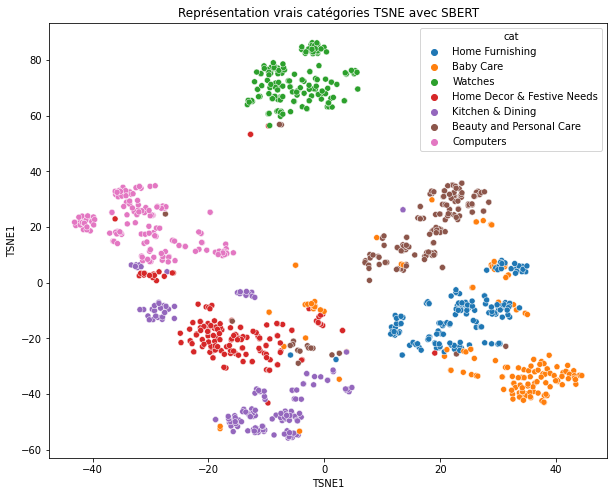

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


ARI : 0.6868318931987671


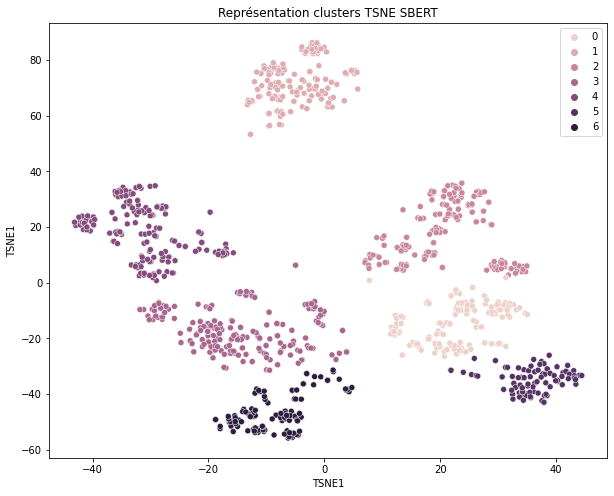

__________________
--- sentence_bow_lem ---
shape vect use (1050, 768)


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


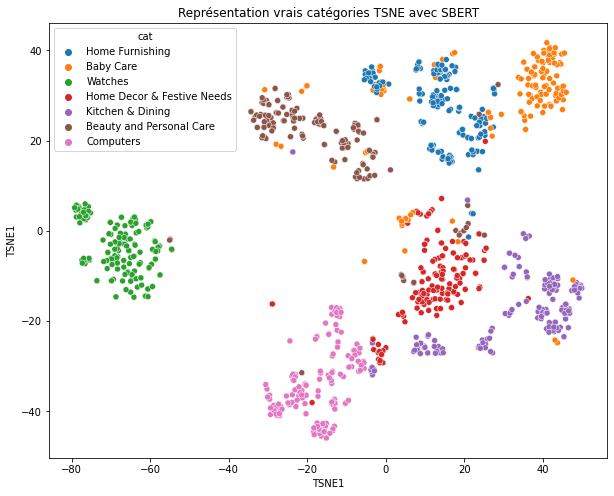

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


ARI : 0.7186637968205347


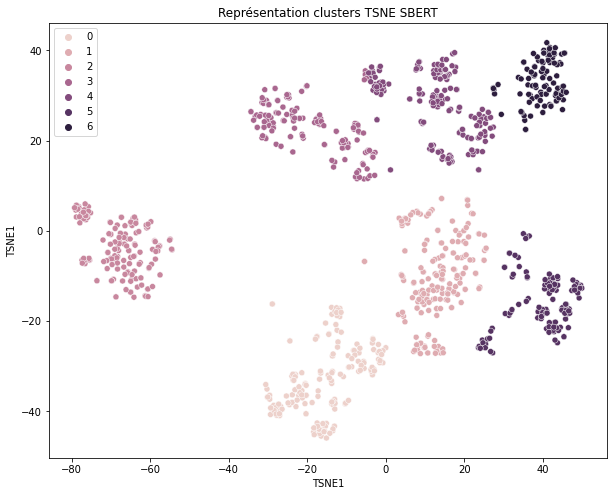

__________________
--- sentence_dl ---
shape vect use (1050, 768)


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


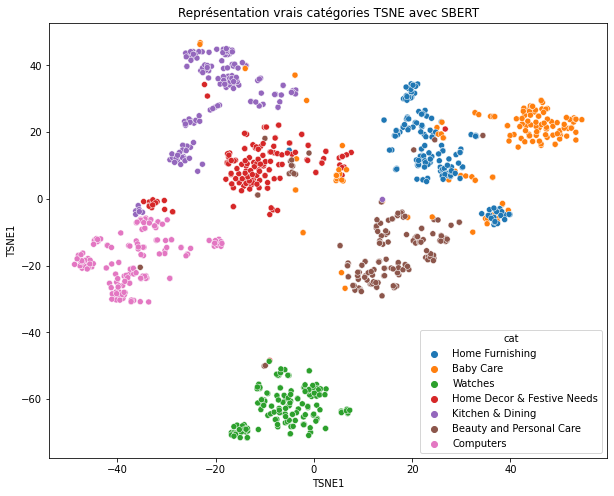

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


ARI : 0.7082959235580327


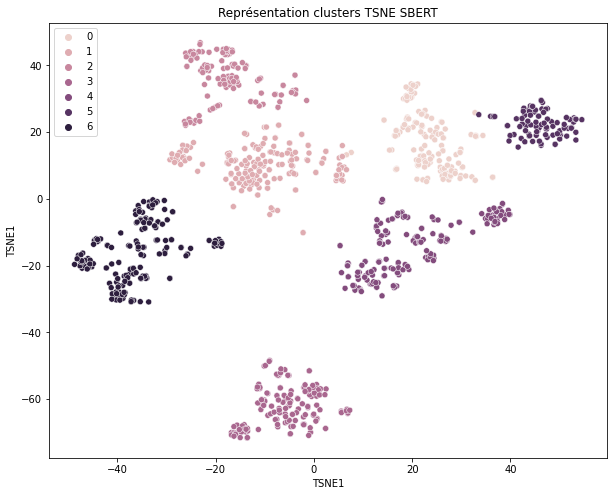

__________________


In [ ]:
"""
Juste un petit test ou j'ai bouclé avec différents perpexity et learning rate 
"""
from sentence_transformers import SentenceTransformer
model = SentenceTransformer('all-mpnet-base-v2')
for k in df_.drop('cat',axis=1).columns:
  print('---',k,'---')
  sentences=df_[k].to_list()
  vect_use=model.encode(sentences)
  print('shape vect use',vect_use.shape)

  tsne=TSNE(n_components=2, perplexity=30, n_iter=2000, 
                                  init='random', learning_rate=200, random_state=42)
  x_tsne=tsne.fit_transform(vect_use)
  fig,ax=plt.subplots(figsize=(10,8))
  sns.scatterplot(x_tsne[:,0],x_tsne[:,1],hue=df.cat,ax=ax)
  ax.set_xlabel('TSNE1')
  ax.set_ylabel('TSNE1')
  plt.title('Représentation vrais catégories TSNE avec SBERT')
  plt.show()
  model1=KMeans(n_clusters=7,random_state=6)
  model1.fit(x_tsne)
  fig,ax=plt.subplots(figsize=(10,8))
  sns.scatterplot(x_tsne[:,0],x_tsne[:,1],hue=model1.labels_,ax=ax)
  ax.set_xlabel('TSNE1')
  ax.set_ylabel('TSNE1')
  plt.title('Représentation clusters TSNE SBERT')
  print('ARI :', adjusted_rand_score(df.cat,model1.labels_))
  plt.show()
  print('__________________')

Downloading:   0%|          | 0.00/737 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/190 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/8.40k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/571 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/116 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/25.5k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/229 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/438M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/239 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/363 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/13.9k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

--- description ---
shape vect use (1050, 768)


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


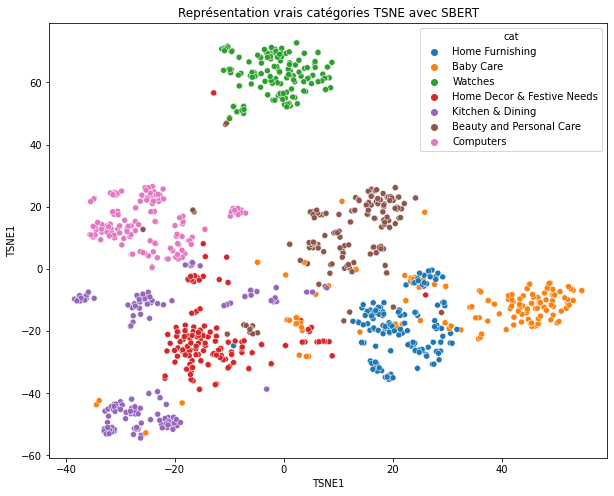

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


ARI : 0.6841431065713262


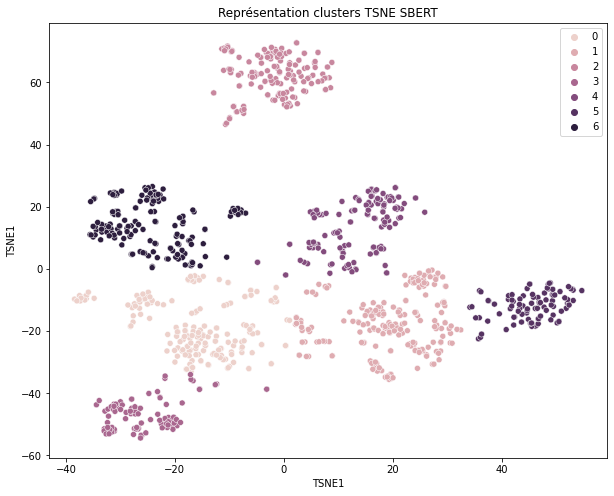

__________________
--- sentence_bow ---
shape vect use (1050, 768)


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


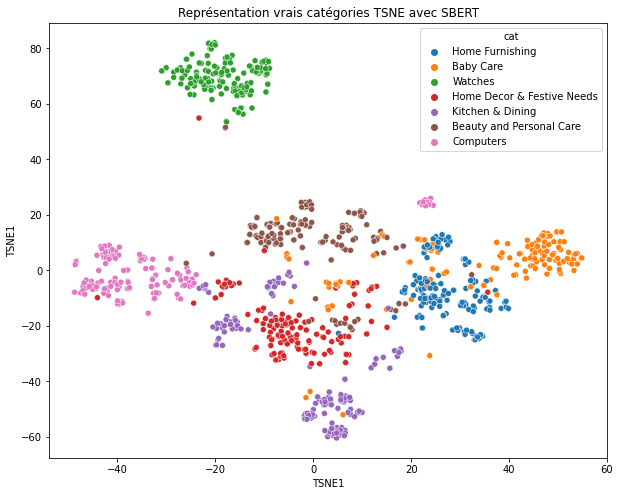

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


ARI : 0.6171462748161946


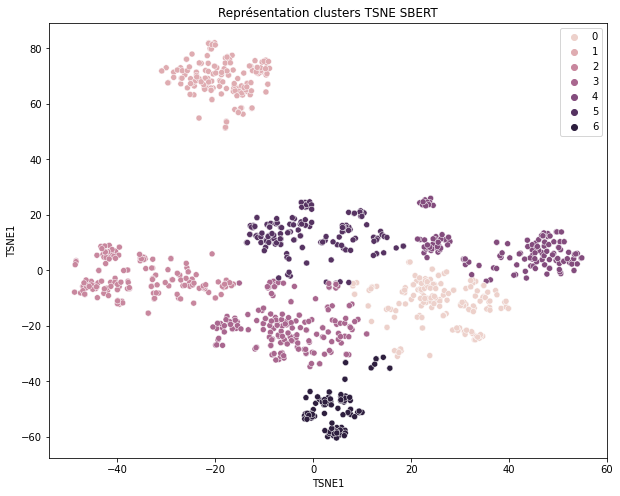

__________________
--- sentence_bow_lem ---
shape vect use (1050, 768)


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


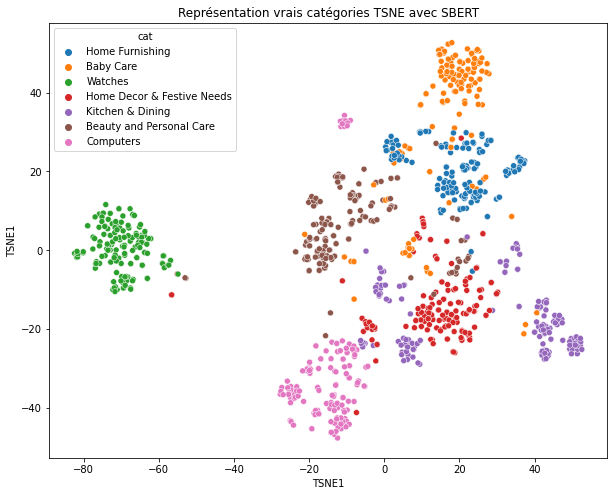

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


ARI : 0.6637468545383348


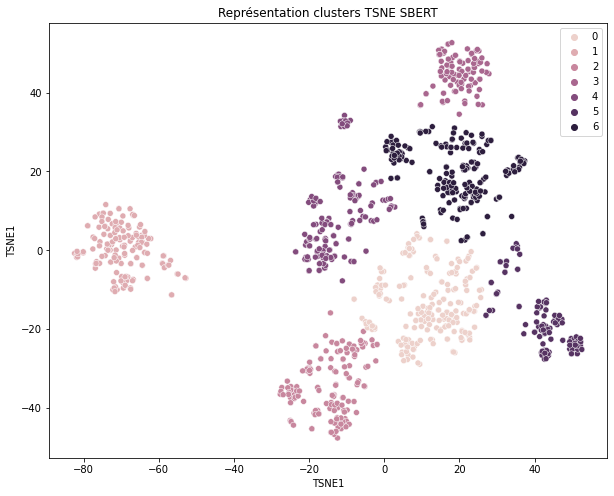

__________________
--- sentence_dl ---
shape vect use (1050, 768)


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


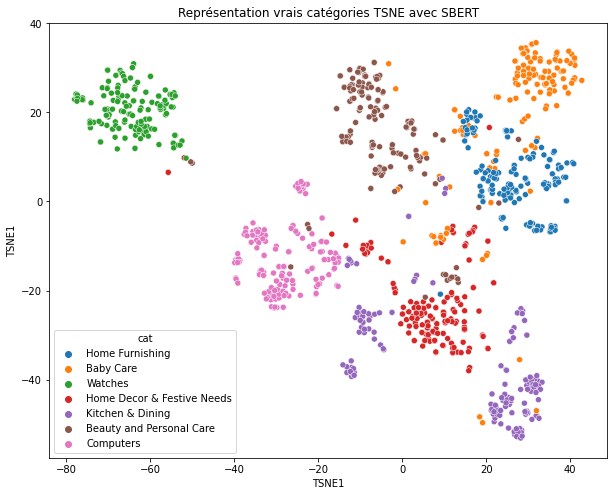

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


ARI : 0.6802170695103317


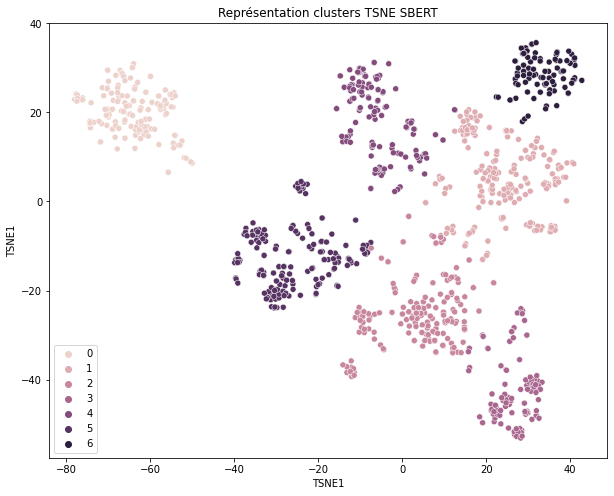

__________________


In [ ]:
"""
Juste un petit test ou j'ai bouclé avec différents perpexity et learning rate 
"""
from sentence_transformers import SentenceTransformer
model = SentenceTransformer('multi-qa-mpnet-base-dot-v1')
for k in df_.drop('cat',axis=1).columns:
  print('---',k,'---')
  sentences=df_[k].to_list()
  vect_use=model.encode(sentences)
  print('shape vect use',vect_use.shape)

  tsne=TSNE(n_components=2, perplexity=30, n_iter=2000, 
                                  init='random', learning_rate=200, random_state=42)
  x_tsne=tsne.fit_transform(vect_use)
  fig,ax=plt.subplots(figsize=(10,8))
  sns.scatterplot(x_tsne[:,0],x_tsne[:,1],hue=df.cat,ax=ax)
  ax.set_xlabel('TSNE1')
  ax.set_ylabel('TSNE1')
  plt.title('Représentation vrais catégories TSNE avec SBERT')
  plt.show()
  model1=KMeans(n_clusters=7,random_state=6)
  model1.fit(x_tsne)
  fig,ax=plt.subplots(figsize=(10,8))
  sns.scatterplot(x_tsne[:,0],x_tsne[:,1],hue=model1.labels_,ax=ax)
  ax.set_xlabel('TSNE1')
  ax.set_ylabel('TSNE1')
  plt.title('Représentation clusters TSNE SBERT')
  print('ARI :', adjusted_rand_score(df.cat,model1.labels_))
  plt.show()
  print('__________________')